1- Install Modules:

install ultralytics for YOLOv8

In [1]:
#-- Install-----------------------------------------------------------------------------------------------------
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()
#---------------------------------------------------------------------------------------------------------------

Ultralytics YOLOv8.0.239 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5310.5/8062.4 GB disk)


2- Import Modules:

In [2]:
#-- Import -----------------------------------------------------------------------------------------------------
from ultralytics import YOLO
import yaml

import torch

import numpy as np
import pandas as pd

import cv2
from IPython import display
import matplotlib.pyplot as plt

import shutil
import os

import random
#---------------------------------------------------------------------------------------------------------------

3- Download Drone Dataset:

ds linke : https://universe.roboflow.com/mltrain/drone-detection-iwgzl/dataset/1#

Note: sign up on roboflow.com and obtain your API_KEY for usage.

In [3]:
#-- Download Drone Dataset From Roboflow  ----------------------------------------------------------------------
!curl -L "https://public.roboflow.com/ds/YOUR_API_KEY" > roboflow.zip
!unzip -o roboflow.zip
!rm roboflow.zip

display.clear_output()
print('DS successfully downloaded :)')
#---------------------------------------------------------------------------------------------------------------

DS successfully downloaded :)


4- Initialize Params:

This project was written and executed on kaggle.com. If you choose to run it in a different environment, please ensure to configure the output_path variable according to your specific path.

In [4]:
#-- Initialize -------------------------------------------------------------------------------------------------
output_path = '/kaggle/working/'

train_img_dir = output_path + 'train/images/'
val_img_dir = output_path + 'valid/images/'
test_img_dir = output_path + 'test/images/'

train_lbl_dir = output_path + 'train/labels/'
val_lbl_dir = output_path + 'valid/labels/'
test_lbl_dir = output_path + 'test/labels/'

NUM_EPOCHS = 40

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device:' , DEVICE)

data_config_file = 'data.yaml'

CONF_THRESHOLDS = [0.25,0.3,0.4,0.5,0.6,0.75,0.9]
IOU_THRESHOLDS = [0.5,0.6,0.7,0.8] 
NUMBER_OF_FROZEN_LAYERS = [0,2,4,5,7,10,12,15,17,20,22]

plots_dir = output_path + 'plots/' 
if shutil.os.path.exists(plots_dir):
    shutil.rmtree(plots_dir)
shutil.os.makedirs(plots_dir)
#---------------------------------------------------------------------------------------------------------------

device: cuda


5- Retrieve the sizes of the training, validation, and test datasets.

In [5]:
#-- DS Size ----------------------------------------------------------------------------------------------------
train_size = len([name for name in os.listdir(train_img_dir) if os.path.isfile(os.path.join(train_img_dir, name))])
val_size = len([name for name in os.listdir(val_img_dir) if os.path.isfile(os.path.join(val_img_dir, name))])
test_size = len([name for name in os.listdir(test_img_dir) if os.path.isfile(os.path.join(test_img_dir, name))])

print(f'train size:{train_size}\nvalidation size:{val_size}\ntest size:{test_size}')
#---------------------------------------------------------------------------------------------------------------

train size:1019
validation size:293
test size:149


6- Present 5 images from the training dataset next to images with bounding boxes:

We have defined two functions:

    draw_bboxes: A function to draw bounding boxes on an image.


    read_bboxes: A function to read and convert bounding box coordinates.

In [6]:
# Function to draw bounding boxes on an image ------------------------------------------------------------------
def draw_bboxes(image, bboxes):
    for bbox in bboxes:
        x, y, w, h = bbox
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    return image
#---------------------------------------------------------------------------------------------------------------

In [7]:
#-- Function to read and convert bounding box coordinates ------------------------------------------------------
def read_bboxes(file_path, img_shape):
    with open(file_path, 'r') as file:
        bboxes = []
        for line in file:
            # YOLO format: class, x_center, y_center, width, height (normalized)
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            x_center, y_center = x_center * img_shape[1], y_center * img_shape[0]
            width, height = width * img_shape[1], height * img_shape[0]
            x, y = int(x_center - width / 2), int(y_center - height / 2)
            bboxes.append([int(x), int(y), int(width), int(height)])
    return bboxes
#---------------------------------------------------------------------------------------------------------------

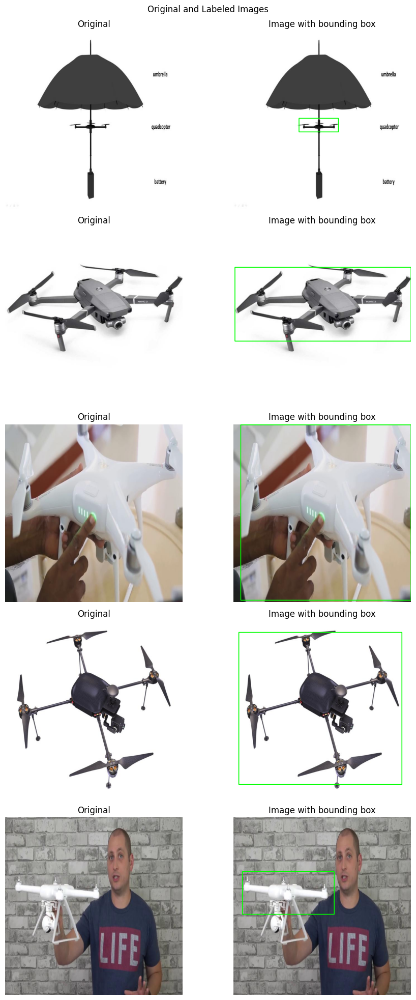

In [8]:
#-- show 5 random images from our training set next to labeled images with bounding boxes ----------------------
#-- Get a list of image file names --
image_files = [f for f in os.listdir(train_img_dir) if f.endswith('.jpg')]
random.shuffle(image_files)

#-- Select 5 random images --
selected_images = image_files[:5]

#-- Create subplots --
fig, axes = plt.subplots(5, 2, figsize=(10, 20))
fig.suptitle('Original and Labeled Images\n')

for i, img_file in enumerate(selected_images):
    img_path = os.path.join(train_img_dir, img_file)
    bbox_path = os.path.join(train_lbl_dir, os.path.splitext(img_file)[0] + '.txt')

    #-- Read image --
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #-- Convert from BGR to RGB
    img_shape = image.shape

    #-- Read and draw bounding boxes --
    bboxes = read_bboxes(bbox_path, img_shape)
    image_with_bboxes = draw_bboxes(image.copy(), bboxes)

    #-- Show original and labeled images --
    axes[i, 0].imshow(image)
    axes[i, 0].axis('off')
    axes[i, 0].set_title('Original')

    axes[i, 1].imshow(image_with_bboxes)
    axes[i, 1].axis('off')
    axes[i, 1].set_title('Image with bounding box')

plt.tight_layout()
plt.savefig( plots_dir + 'Original_and_Labeled_Images.png')
plt.show()
#---------------------------------------------------------------------------------------------------------------

7- Modify the configuration file if it is necessary:

We haven't altered the paths for the train, test, and validation datasets, so there's no need to modify the configuration file (data.yaml).

We intend to execute the validation function on the test data. Therefore, we have created a new version of the configuration file (test_data.yaml).



In [9]:
#-- Configuring the .yaml file for evaluating model on test data -----------------------------------------------
test_data_config_file = output_path + 'test_data.yaml'

config = {'train': '../train/images',
         'val': '../test/images',
         'nc': 1,
         'names': ['drone']}

with open(test_data_config_file, 'w') as file:
    yaml.dump(config, file, default_flow_style=False)
#---------------------------------------------------------------------------------------------------------------

8- Load YOLO Model and Train

In [10]:
#-- Train Model and Save Results --------------------------------------------------------------------------
def train_model(model, number_of_frozen_layers, num_of_epochs):   
    
    #--  set project and name to create new folder for each run --
    project_value = 'model_' + str(number_of_frozen_layers) + '_frozen'   
    name_value = 'train'
    
    #-- Train --
    print(f'\n\nTraining Model - {number_of_frozen_layers} frozen layers  ********************************\n\n')
    model.train(data = data_config_file,
                epochs = num_of_epochs,
                freeze = number_of_frozen_layers,
                device = DEVICE,
                val = True,
                save = True,
                exist_ok = True,
                plots=True,
                project = project_value,
                name = name_value)
#---------------------------------------------------------------------------------------------------------------    

In [11]:
#-- Train Model With Different frozen Layers and save Results -------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:
    #-- load YOLO model --
    model = YOLO("yolov8m.pt") 
    
    train_model(model = model,
                number_of_frozen_layers = n_frozen,
                num_of_epochs = NUM_EPOCHS)
    

#-- clear output
display.clear_output()
print('Finished training :)')
#---------------------------------------------------------------------------------------------------------------

Finished training :)


9- Plot different Training Curves:

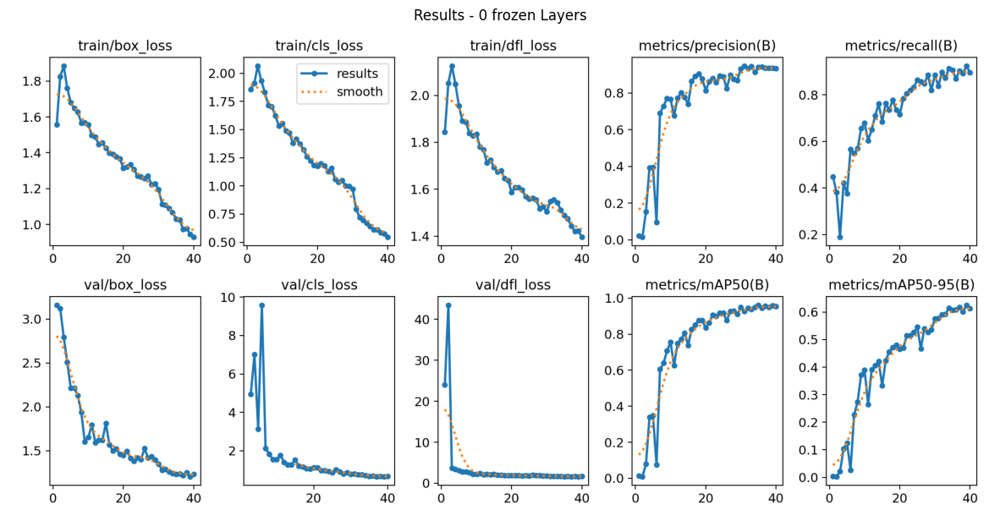

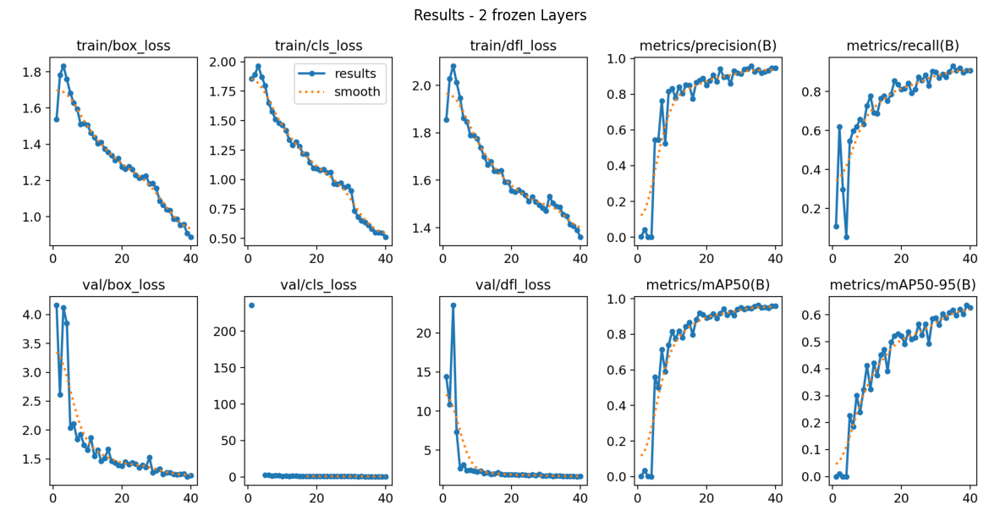

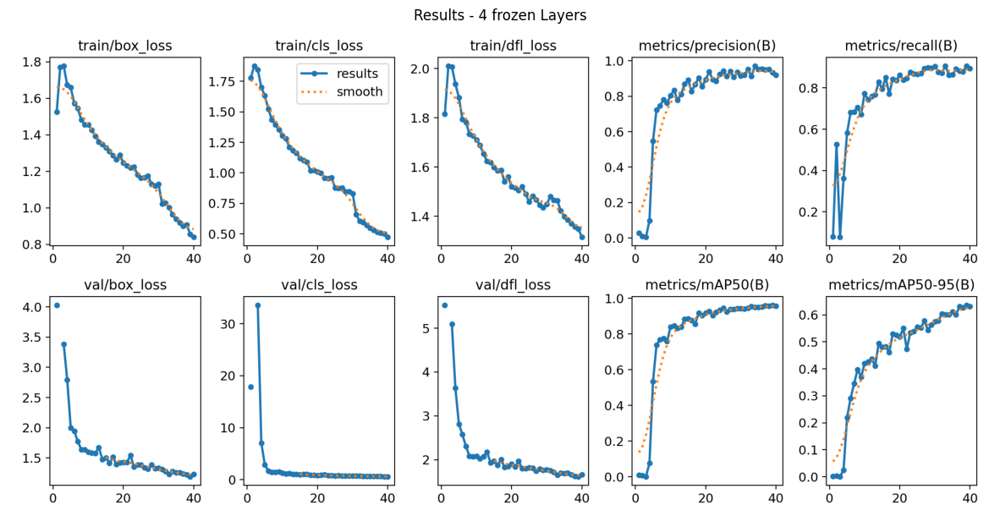

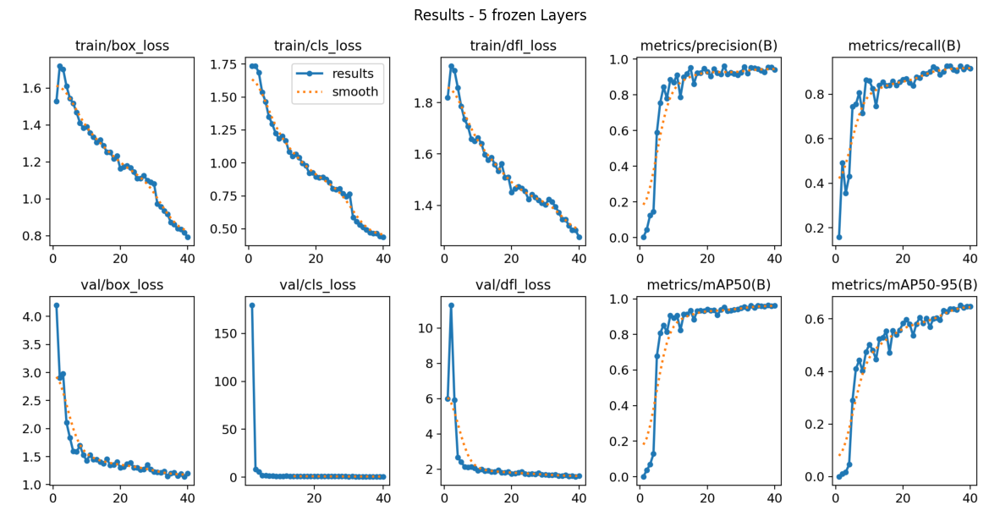

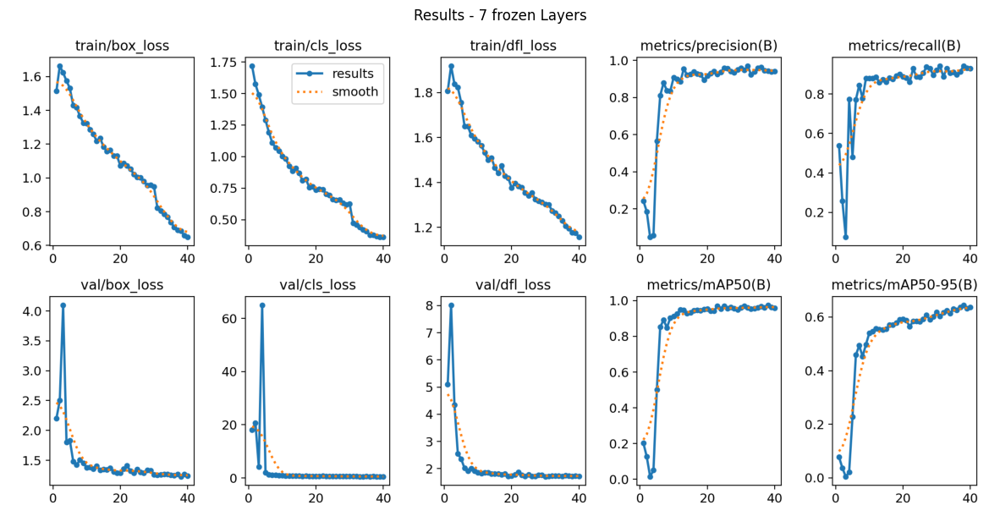

...

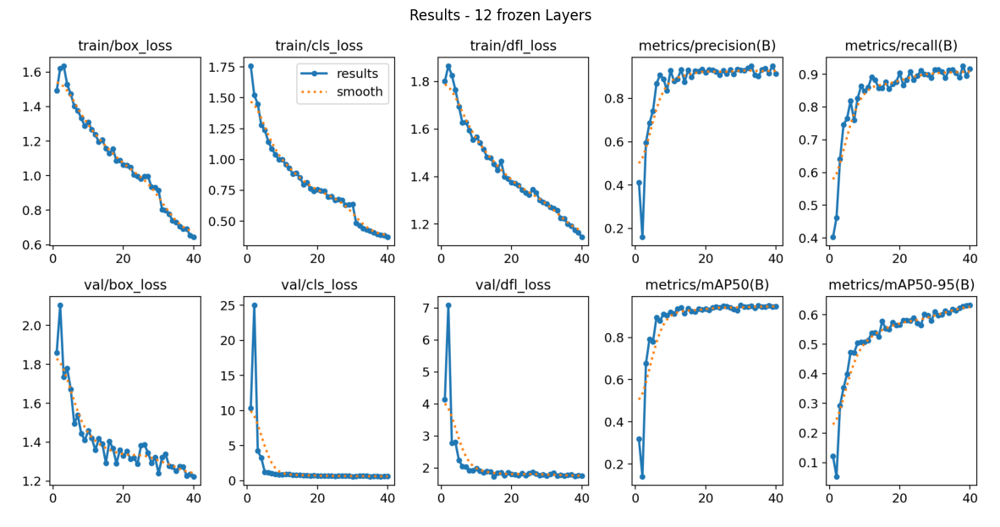

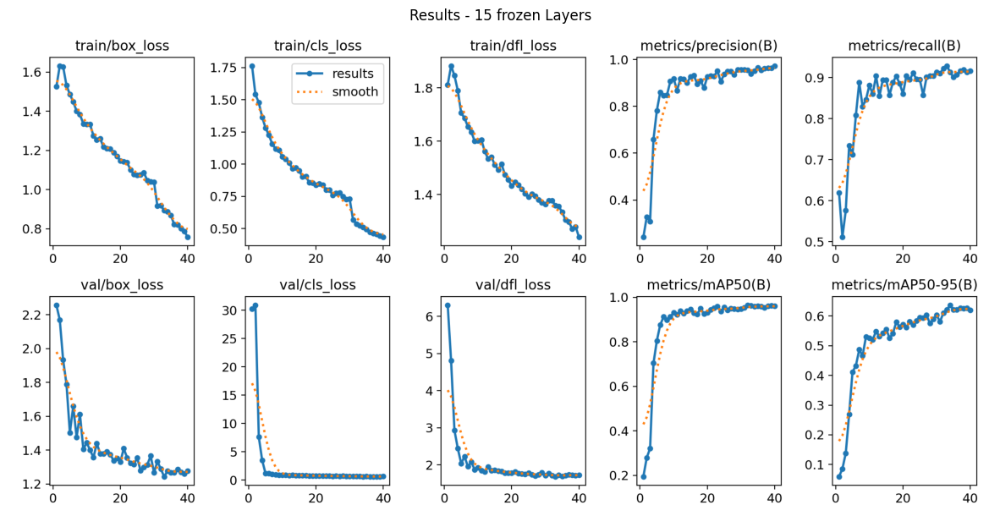

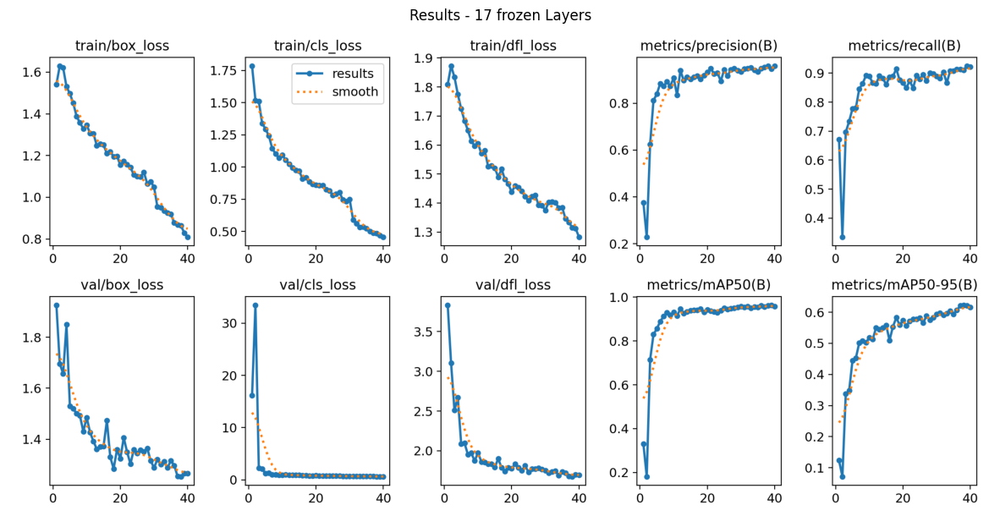

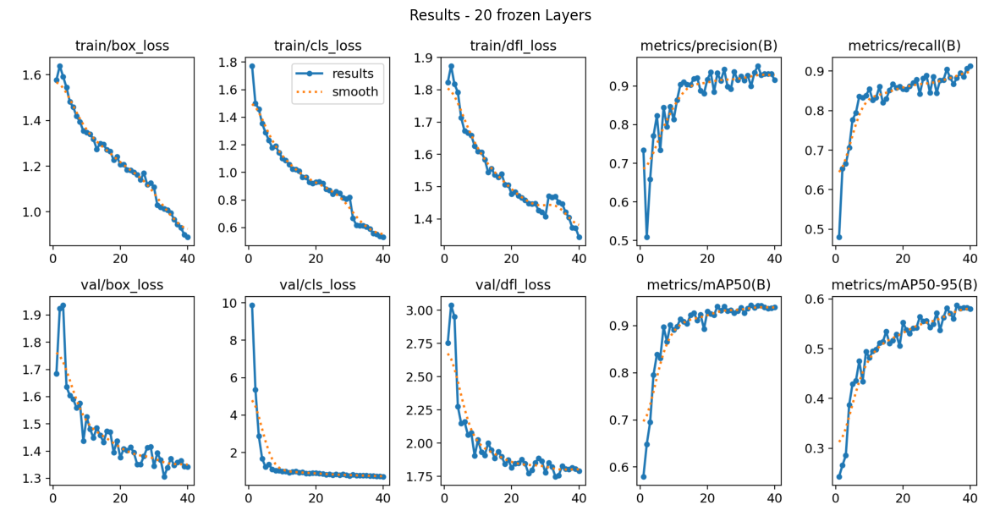

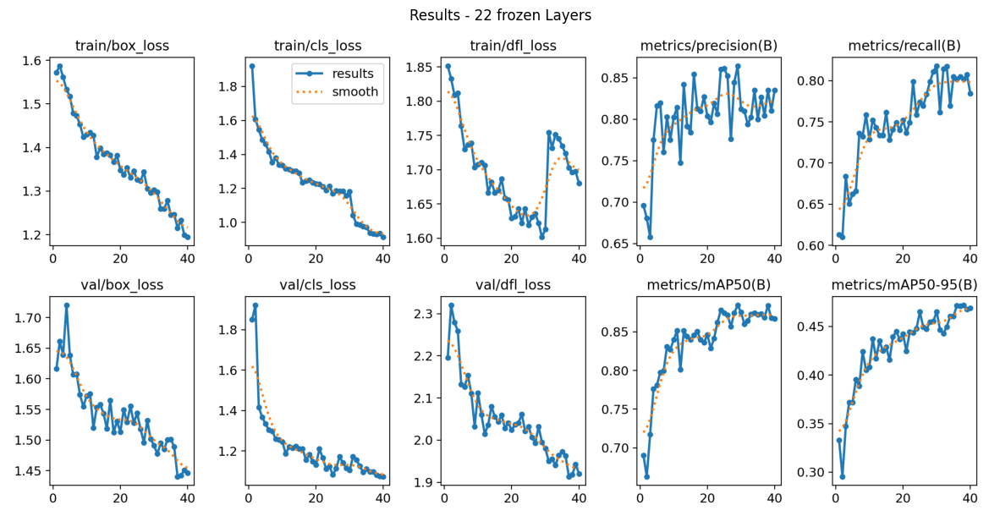

In [12]:
#-- Plot Results Curves -----------------------------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:    
    curves_path = output_path + 'model_' + str(n_frozen) + '_frozen/train/'   
    
    curve_file = curves_path + 'results.png'    
    curve = cv2.cvtColor(cv2.imread(curve_file),cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(15,10))
    plt.title(f'Results - {n_frozen} frozen Layers')
    plt.axis('off')
    plt.imshow(curve)
#---------------------------------------------------------------------------------------------------------------

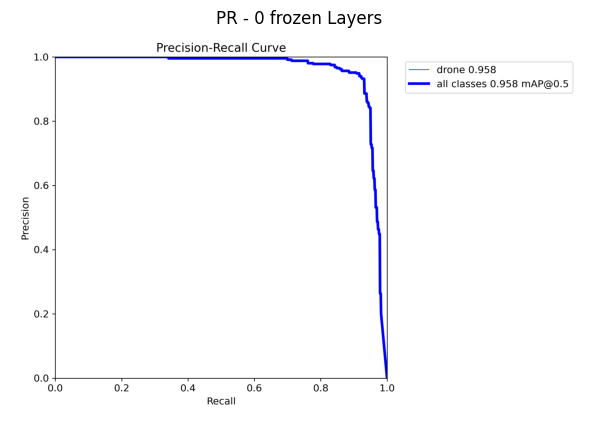

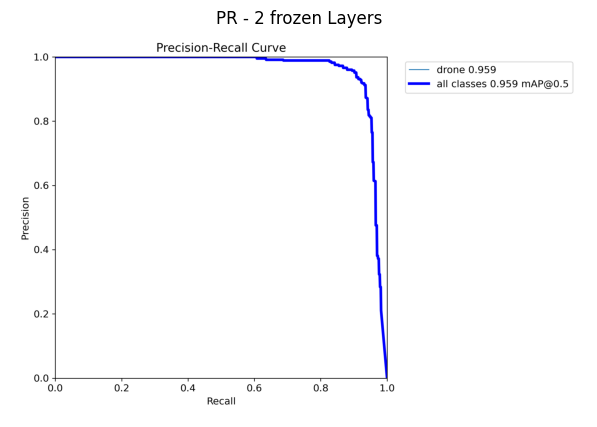

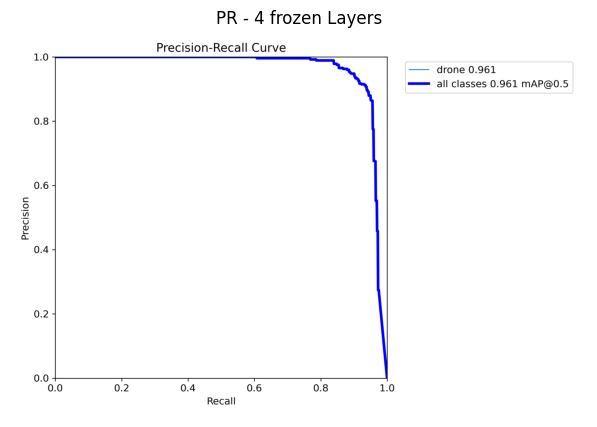

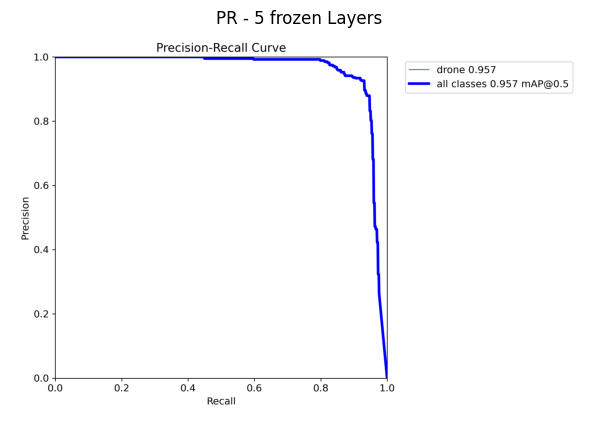

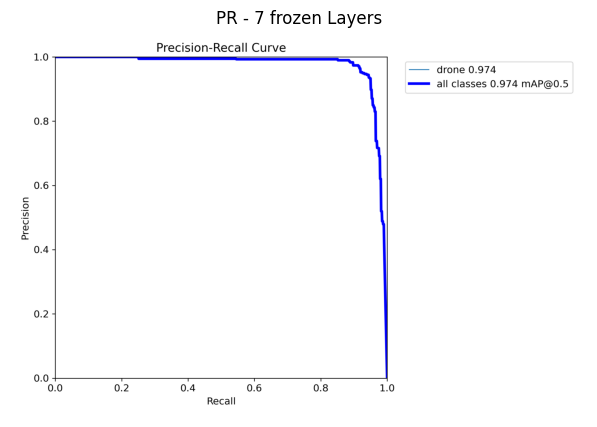

...

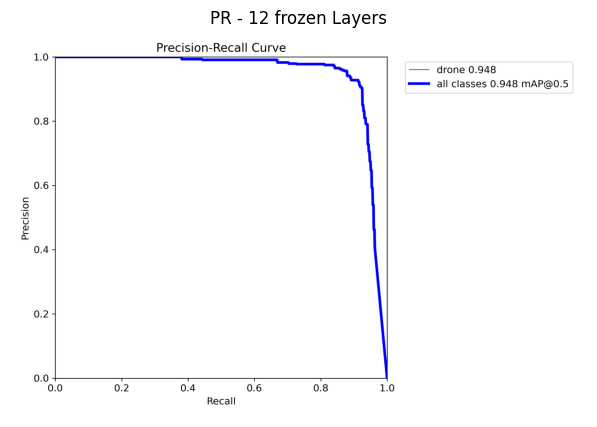

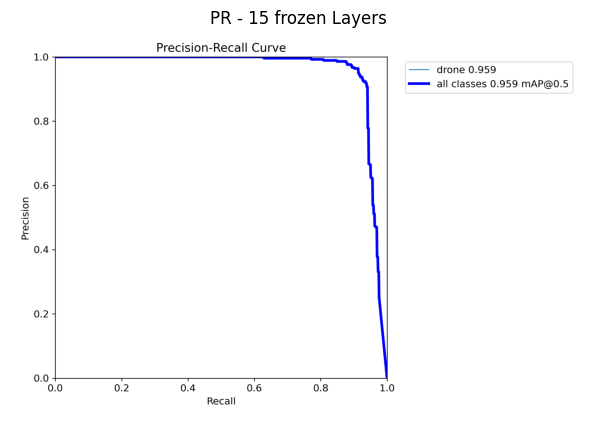

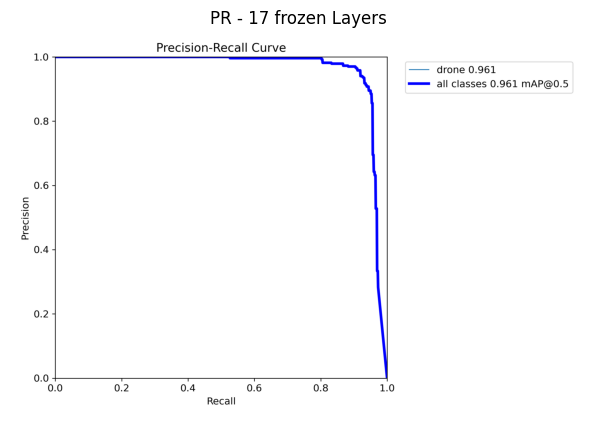

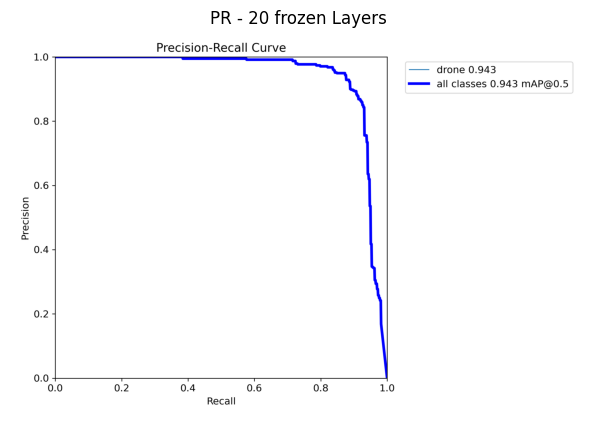

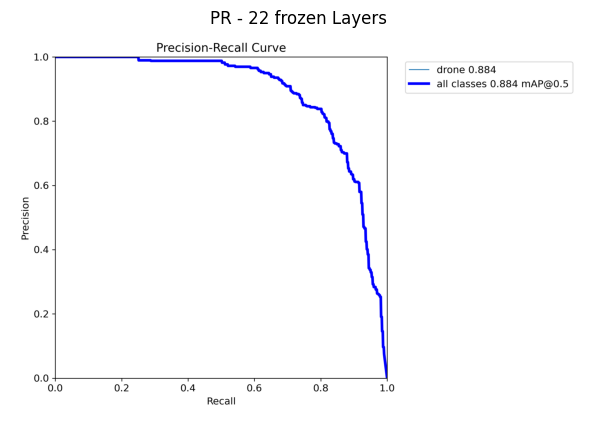

In [13]:
#-- Plot Precision_Recall Curves --------------------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:    
    curves_path = output_path + 'model_' + str(n_frozen) + '_frozen/train/'   
    
    curve_file = curves_path + 'PR_curve.png'    
    curve = cv2.cvtColor(cv2.imread(curve_file),cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8,5))
    plt.title(f'PR - {n_frozen} frozen Layers')
    plt.axis('off')
    plt.imshow(curve)   
#---------------------------------------------------------------------------------------------------------------

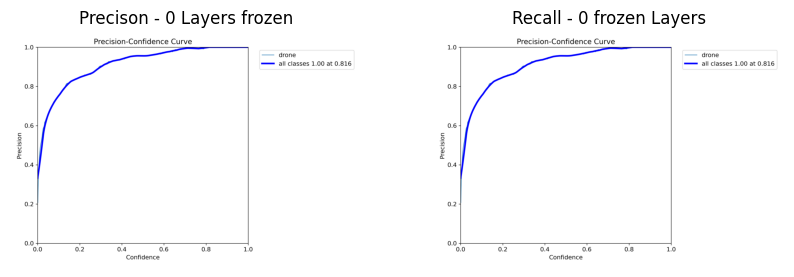

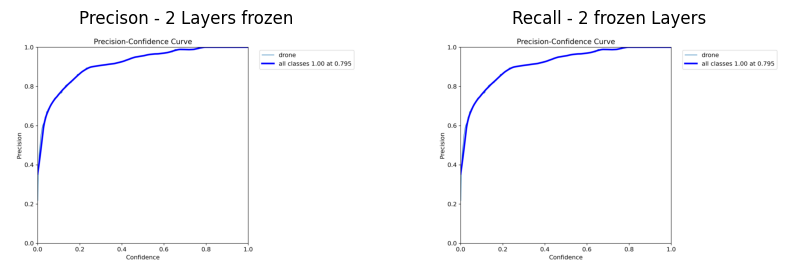

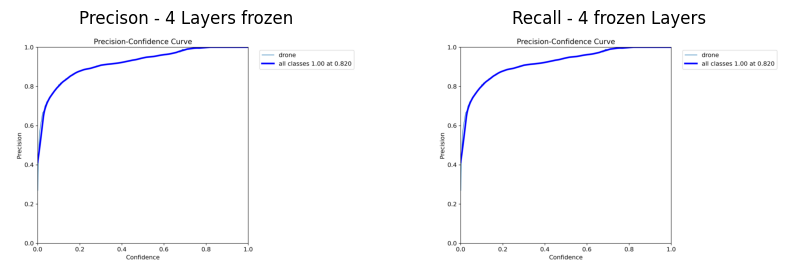

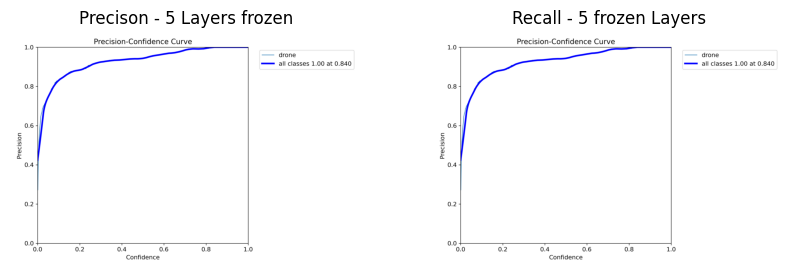

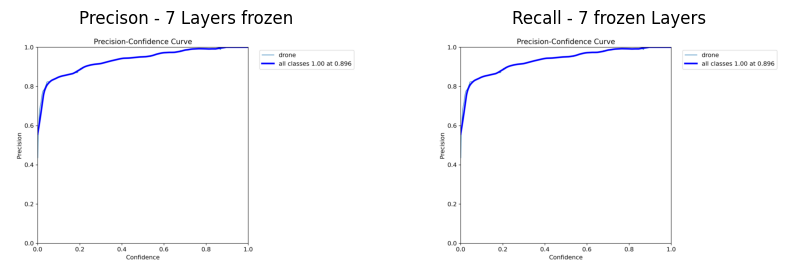

...

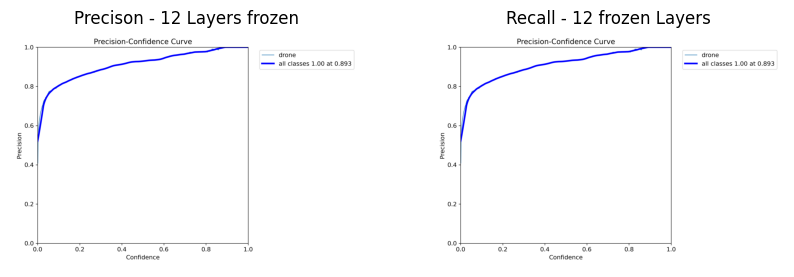

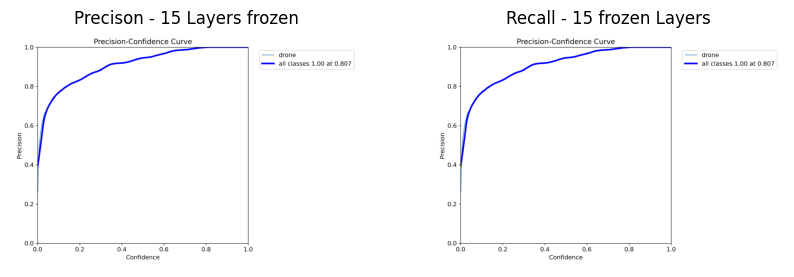

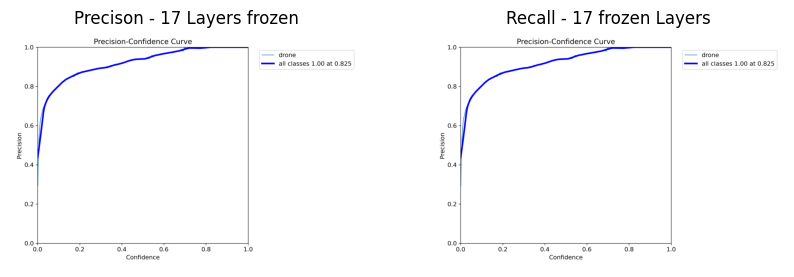

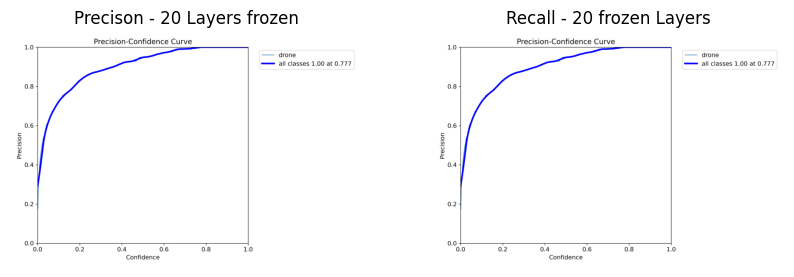

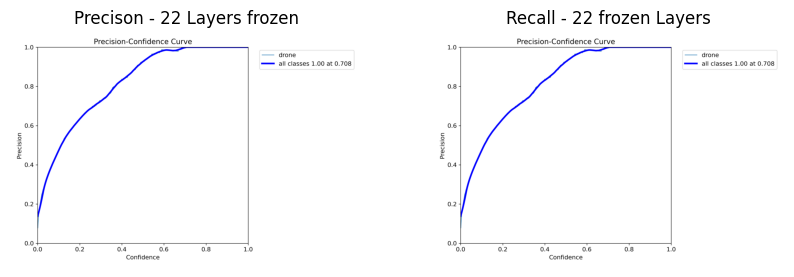

In [14]:
#-- Plot Precision and Recall Curves ----------------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:    
    curves_path = output_path + 'model_' + str(n_frozen) + '_frozen/train/'   
    
    p_curve_file = curves_path + 'P_curve.png'    
    r_curve_file = curves_path + 'R_curve.png'   
    
    p_curve = cv2.cvtColor(cv2.imread(p_curve_file),cv2.COLOR_BGR2RGB)
    r_curve = cv2.cvtColor(cv2.imread(r_curve_file),cv2.COLOR_BGR2RGB) 
    
    fig, (axs1, axs2) = plt.subplots(1, 2, figsize = (10, 8))    
    axs1.title.set_text(f'Precison - {n_frozen} Layers frozen')
    axs1.axis('off')
    axs1.imshow(p_curve)   
    
    axs2.title.set_text(f'Recall - {n_frozen} frozen Layers')
    axs2.axis('off')
    axs2.imshow(p_curve)  
#---------------------------------------------------------------------------------------------------------------

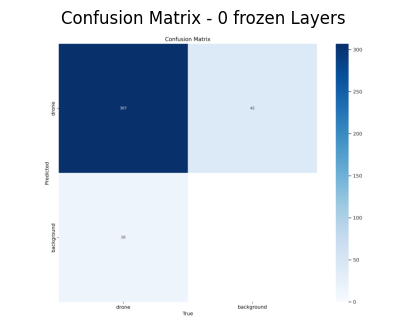

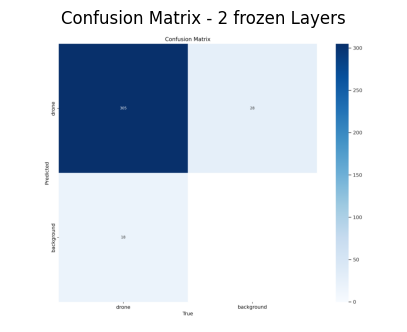

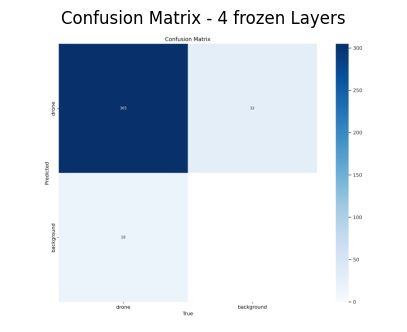

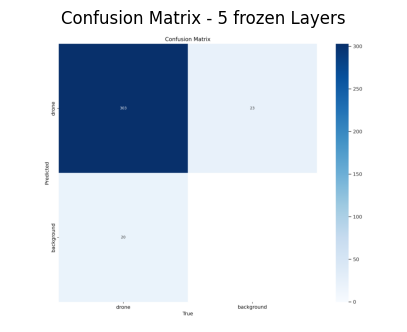

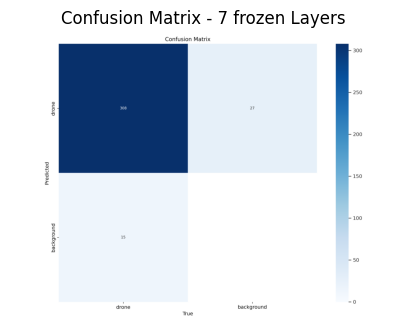

...

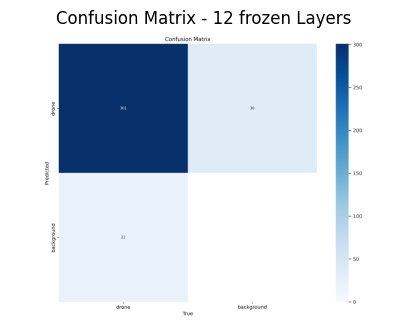

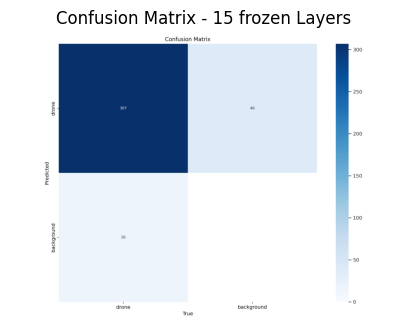

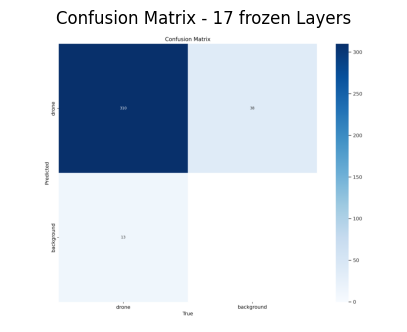

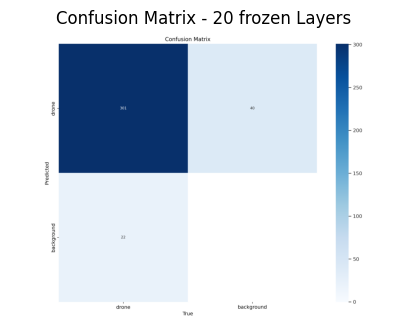

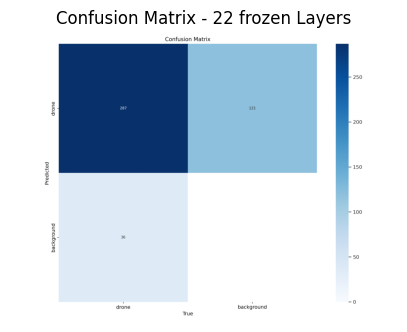

In [15]:
#-- Plot Confusion Matrix --------------------------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:    
    curves_path = output_path + 'model_' + str(n_frozen) + '_frozen/train/'   
    
    cm_file = curves_path + 'confusion_matrix.png'
    cm = cv2.cvtColor(cv2.imread(cm_file),cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(5,4))
    plt.title(f'Confusion Matrix - {n_frozen} frozen Layers')
    plt.axis('off')
    plt.imshow(cm)   
#---------------------------------------------------------------------------------------------------------------

10- Evaluate Model on Validation DS:

In [16]:
#-- Evaluate Model on Val Data ---------------------------------------------------------------------------------
def val_model(model, NUMBER_OF_FROZEN_LAYERS):
    
    project_value = 'model_' + str(NUMBER_OF_FROZEN_LAYERS) + '_frozen'   
    name_valu = 'validation'
    
    #-- Val --
    print(f'\n\nEvaluating Model on Val Data - {NUMBER_OF_FROZEN_LAYERS} frozen layers *******************\n\n')
    metrics = model.val(data = data_config_file,
                        device = DEVICE,
                        project = project_value,
                        name = name_valu)

    map_50_95 = metrics.box.map
    map_50 = metrics.box.map50
    map_75 = metrics.box.map75
    maps = metrics.box.maps #--a list contains map50-95 of each category --
    
    msg = f'''\n\n-----------------------------------------------
                \nmap_50_95:{map_50_95}\nmap_50:{map_50}\nmap_75:{map_75}\nmaps:{maps}
                \n-----------------------------------------------\n\n
            '''
    print(msg)
#---------------------------------------------------------------------------------------------------------------

In [17]:
#-- Val Models With Different frozen Layers and save Results -------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:
    
    #-- load best model --
    best_model_file = output_path + 'model_' + str(n_frozen) + '_frozen' + '/train/weights/best.pt'
    best_model = YOLO(best_model_file)     
    
    val_model(model= best_model,
              NUMBER_OF_FROZEN_LAYERS = n_frozen)
#---------------------------------------------------------------------------------------------------------------



Evaluating Model on Val Data - 0 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.20it/s]


                   all        293        323      0.934      0.924      0.958      0.627
Speed: 1.0ms preprocess, 21.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_0_frozen/validation


-----------------------------------------------
                
map_50_95:0.6265599481578942
map_50:0.9582646254717699
map_75:0.7100580008746084
maps:[    0.62656]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 2 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.10it/s]


                   all        293        323      0.945      0.907      0.959      0.637
Speed: 1.0ms preprocess, 20.1ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to model_2_frozen/validation


-----------------------------------------------
                
map_50_95:0.6366610910440661
map_50:0.9587528423466333
map_75:0.7286390538549357
maps:[    0.63666]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 4 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.19it/s]


                   all        293        323      0.933      0.906      0.961      0.636
Speed: 1.0ms preprocess, 20.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_4_frozen/validation


-----------------------------------------------
                
map_50_95:0.635772044489782
map_50:0.960946235921831
map_75:0.7239067269896999
maps:[    0.63577]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 5 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:39<00:00,  2.09s/it]


                   all        293        323      0.926      0.929      0.957      0.651
Speed: 1.5ms preprocess, 20.4ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to model_5_frozen/validation


-----------------------------------------------
                
map_50_95:0.6506910009748645
map_50:0.9565330179995385
map_75:0.7392874694090379
maps:[    0.65069]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 7 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.10it/s]


                   all        293        323      0.947      0.943      0.975      0.644
Speed: 1.1ms preprocess, 20.0ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_7_frozen/validation


-----------------------------------------------
                
map_50_95:0.6435008344448021
map_50:0.9745301200096204
map_75:0.7134403046341944
maps:[     0.6435]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 10 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.12it/s]


                   all        293        323       0.92      0.916      0.948      0.632
Speed: 1.0ms preprocess, 20.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/validation


-----------------------------------------------
                
map_50_95:0.6324003373166184
map_50:0.9480672306083395
map_75:0.7008931180840294
maps:[     0.6324]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 12 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.18it/s]


                   all        293        323       0.92      0.916      0.948      0.632
Speed: 1.1ms preprocess, 21.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/validation


-----------------------------------------------
                
map_50_95:0.6324003373166184
map_50:0.9480672306083395
map_75:0.7008931180840294
maps:[     0.6324]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 15 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.09it/s]


                   all        293        323      0.951      0.913      0.958      0.637
Speed: 0.9ms preprocess, 20.3ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to model_15_frozen/validation


-----------------------------------------------
                
map_50_95:0.6366106371666308
map_50:0.95849162147461
map_75:0.6984345739351479
maps:[    0.63661]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 17 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.11it/s]


                   all        293        323      0.956      0.907      0.959      0.623
Speed: 1.0ms preprocess, 20.6ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to model_17_frozen/validation


-----------------------------------------------
                
map_50_95:0.6227240173270137
map_50:0.9593257887150068
map_75:0.6954259232102308
maps:[    0.62272]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 20 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:09<00:00,  2.08it/s]


                   all        293        323      0.928      0.883      0.943      0.588
Speed: 1.0ms preprocess, 20.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/validation


-----------------------------------------------
                
map_50_95:0.5875575500739829
map_50:0.9432874942116949
map_75:0.6481167700741687
maps:[    0.58756]
                
-----------------------------------------------


            


Evaluating Model on Val Data - 22 frozen layers *******************


Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/valid/labels.cache... 293 images, 0 backgrounds, 0 corrupt: 100%|██████████| 293/293 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:08<00:00,  2.12it/s]


                   all        293        323      0.819      0.813      0.885      0.474
Speed: 1.1ms preprocess, 21.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_22_frozen/validation


-----------------------------------------------
                
map_50_95:0.47436051439882065
map_50:0.885006377319427
map_75:0.4216682409081694
maps:[    0.47436]
                
-----------------------------------------------


            


11- Evaluate Model On Test DS:

In [18]:
#-- Evaluate Model on Test Data ---------------------------------------------------------------------------------
def test_model(model, number_of_frozen_layers, conf , iou):
    
    project_value = 'model_' + str(number_of_frozen_layers) + '_frozen'   
    name_valu = 'test/test_' + str(conf) + '_' + str(iou)
    
    #-- Val --
    log = f'''
            \n\nEvaluating Model on Test Data - {number_of_frozen_layers} frozen layers *******************
            \n--- conf = {conf} - iou = {iou} ---\n
            '''
    print(log)
    
    metrics = model.val(data = test_data_config_file,
                        conf = conf,
                        iou = iou,
                        device = DEVICE,
                        project = project_value,
                        name = name_valu)

    map_50_95 = metrics.box.map
    map_50 = metrics.box.map50
    map_75 = metrics.box.map75
    maps = metrics.box.maps #--a list contains map50-95 of each category --
    
    msg = f'''\n-----------------------------------------------
                \nmap_50_95:{map_50_95}\nmap_50:{map_50}\nmap_75:{map_75}\nmaps:{maps}
                \n-----------------------------------------------\n
            '''
    print(msg)
    
    #-- Save metrics --
    results_file = 'model_' + str(number_of_frozen_layers) + '_results.csv'
    df_results = pd.read_csv(results_file)    
            
    results = {'conf':conf,
               'iou':iou,
               'map_50_95':map_50_95,
               'map_50':map_50,
               'map_75':map_75,
               'maps':maps}

    temp_df = pd.DataFrame(results)
    df_results = pd.concat([df_results, temp_df], ignore_index=True)  
    df_results.to_csv(output_path + results_file, index=False)    
#---------------------------------------------------------------------------------------------------------------

In [19]:
#-- Test Models With Different frozen Layers and save Results -------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:
    
    #-- load best model --
    best_model_file = output_path + 'model_' + str(n_frozen) + '_frozen' + '/train/weights/best.pt'
    best_model = YOLO(best_model_file)     
    
    #-- Create Empty DF to save results --
    cols_names = ['conf', 'iou', 'map_50_95', 'map_50', 'map_75', 'maps']        
    df_results = pd.DataFrame(columns=cols_names)
    results_file = 'model_' + str(n_frozen) + '_results.csv'
    df_results.to_csv(output_path + results_file, index=False)    
    
    for conf in CONF_THRESHOLDS:
        for iou in IOU_THRESHOLDS:   
            test_model(model = best_model,
                       number_of_frozen_layers = n_frozen,
                       conf = conf,
                       iou = iou)            
#---------------------------------------------------------------------------------------------------------------


            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<00:00, 1257.26it/s]

val: New cache created: /kaggle/working/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.946      0.914      0.949       0.68
Speed: 2.1ms preprocess, 20.2ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_0_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6801242446502821
map_50:0.9492741747578917
map_75:0.8305236446682498
maps:[    0.68012]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.958      0.889      0.947      0.677
Speed: 1.7ms preprocess, 20.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6772460103342903
map_50:0.9472822968087246
map_75:0.8269947987683802
maps:[    0.67725]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.958      0.889      0.946      0.675
Speed: 2.1ms preprocess, 20.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6754818004580663
map_50:0.9462081844579231
map_75:0.824787960292269
maps:[    0.67548]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.921       0.87      0.935      0.668
Speed: 1.8ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.667697478682831
map_50:0.9352879442785885
map_75:0.8211224930881134
maps:[     0.6677]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.949      0.914       0.95      0.681
Speed: 1.5ms preprocess, 21.1ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to model_0_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6805856625314671
map_50:0.9495259001026104
map_75:0.8311093502047517
maps:[    0.68059]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.958      0.889      0.948      0.678
Speed: 2.0ms preprocess, 20.9ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_0_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6776739830202703
map_50:0.9475157762127563
map_75:0.8275380503021227
maps:[    0.67767]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.958      0.889      0.946      0.676
Speed: 1.9ms preprocess, 20.7ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_0_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6758894567146849
map_50:0.9464305802858883
map_75:0.8253054229573004
maps:[    0.67589]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.921       0.87      0.937      0.669
Speed: 2.0ms preprocess, 22.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.669163311768362
map_50:0.9365425753617911
map_75:0.821129897448459
maps:[    0.66916]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.961      0.901      0.944      0.677
Speed: 2.0ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6767043330383888
map_50:0.9442818217577098
map_75:0.8270650235480288
maps:[     0.6767]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.942      0.901      0.943      0.675
Speed: 1.8ms preprocess, 22.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_0_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6751954241245233
map_50:0.9431830222556332
map_75:0.8252071842128489
maps:[     0.6752]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.942      0.901      0.943      0.675
Speed: 1.9ms preprocess, 21.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to model_0_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6751954241245233
map_50:0.9431830222556332
map_75:0.8252071842128489
maps:[     0.6752]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.921       0.87      0.933      0.668
Speed: 2.0ms preprocess, 22.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_0_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6680787526753742
map_50:0.9333466296825745
map_75:0.8202800764404335
maps:[    0.66808]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


                   all        149        162      0.966      0.883      0.936      0.676
Speed: 1.5ms preprocess, 20.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_0_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6764660231964954
map_50:0.9356775940411642
map_75:0.8296593037007578
maps:[    0.67647]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


                   all        149        162      0.966      0.883      0.936      0.676
Speed: 2.1ms preprocess, 20.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_0_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6764660231964954
map_50:0.9356775940411642
map_75:0.8296593037007578
maps:[    0.67647]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.966      0.883      0.936      0.676
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to model_0_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6764660231964954
map_50:0.9356775940411642
map_75:0.8296593037007578
maps:[    0.67647]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162       0.92       0.87      0.928      0.671
Speed: 1.7ms preprocess, 20.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to model_0_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6710782270422941
map_50:0.9275712074882343
map_75:0.8266113574732041
maps:[    0.67108]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.978       0.84      0.916      0.665
Speed: 1.9ms preprocess, 20.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_0_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6647635410242081
map_50:0.9155039202146394
map_75:0.8188476710782094
maps:[    0.66476]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.978       0.84      0.916      0.665
Speed: 2.4ms preprocess, 20.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_0_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6647635410242081
map_50:0.9155039202146394
map_75:0.8188476710782094
maps:[    0.66476]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.978       0.84      0.916      0.665
Speed: 2.0ms preprocess, 20.5ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to model_0_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6647635410242081
map_50:0.9155039202146394
map_75:0.8188476710782094
maps:[    0.66476]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.951       0.84      0.911      0.662
Speed: 2.0ms preprocess, 22.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_0_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6617989886552293
map_50:0.9111525550915798
map_75:0.8137785767743457
maps:[     0.6618]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]


                   all        149        162          1      0.586      0.793      0.592
Speed: 2.1ms preprocess, 21.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_0_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.5918803286449016
map_50:0.7931820895522388
map_75:0.732023859985897
maps:[    0.59188]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162          1      0.586      0.793      0.592
Speed: 2.1ms preprocess, 23.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_0_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.5918803286449016
map_50:0.7931820895522388
map_75:0.732023859985897
maps:[    0.59188]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162          1      0.586      0.793      0.592
Speed: 2.0ms preprocess, 20.8ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to model_0_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.5918803286449016
map_50:0.7931820895522388
map_75:0.732023859985897
maps:[    0.59188]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162          1      0.586      0.793      0.592
Speed: 2.0ms preprocess, 20.6ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_0_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.5918803286449016
map_50:0.7931820895522388
map_75:0.732023859985897
maps:[    0.59188]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


                   all        149        162          1     0.0247      0.512      0.436
Speed: 2.7ms preprocess, 20.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_0_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.43592451661392406
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43592]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


                   all        149        162          1     0.0247      0.512      0.436
Speed: 2.5ms preprocess, 21.0ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to model_0_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.43592451661392406
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43592]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


                   all        149        162          1     0.0247      0.512      0.436
Speed: 2.6ms preprocess, 21.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_0_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.43592451661392406
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43592]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 0 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


                   all        149        162          1     0.0247      0.512      0.436
Speed: 2.6ms preprocess, 21.1ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to model_0_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.43592451661392406
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43592]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.949      0.914       0.95      0.689
Speed: 1.9ms preprocess, 20.7ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_2_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6890101414487586
map_50:0.9495345514399129
map_75:0.8041257223440972
maps:[    0.68901]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.949      0.914      0.949      0.689
Speed: 1.9ms preprocess, 20.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6889730640937646
map_50:0.9494750953994322
map_75:0.8040732627637737
maps:[    0.68897]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.952      0.895      0.948      0.687
Speed: 1.7ms preprocess, 20.2ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to model_2_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6872408828982304
map_50:0.9480076715858756
map_75:0.8019511195281017
maps:[    0.68724]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.916      0.879       0.94       0.68
Speed: 1.8ms preprocess, 22.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_2_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6797230186168466
map_50:0.9402422272583362
map_75:0.794164495766976
maps:[    0.67972]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


                   all        149        162      0.949      0.914       0.95      0.689
Speed: 2.1ms preprocess, 21.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_2_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6890101414487586
map_50:0.9495345514399129
map_75:0.8041257223440972
maps:[    0.68901]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.949      0.914      0.949      0.689
Speed: 2.8ms preprocess, 20.4ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_2_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6889730640937646
map_50:0.9494750953994322
map_75:0.8040732627637737
maps:[    0.68897]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.952      0.895      0.948      0.687
Speed: 1.5ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6872408828982304
map_50:0.9480076715858756
map_75:0.8019511195281017
maps:[    0.68724]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.916      0.879      0.941      0.681
Speed: 2.2ms preprocess, 20.9ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to model_2_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6807972788039709
map_50:0.9408427783145272
map_75:0.7955857145064021
maps:[     0.6808]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162      0.967      0.895      0.942      0.686
Speed: 1.7ms preprocess, 21.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.686433857854696
map_50:0.9415221479673578
map_75:0.8014327735628496
maps:[    0.68643]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.967      0.895      0.942      0.686
Speed: 1.8ms preprocess, 20.6ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to model_2_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.686433857854696
map_50:0.9415221479673578
map_75:0.8014327735628496
maps:[    0.68643]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162       0.96      0.895      0.941      0.686
Speed: 2.3ms preprocess, 23.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_2_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6857309776832677
map_50:0.940827470243179
map_75:0.8006318190812793
maps:[    0.68573]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.906      0.895      0.935       0.68
Speed: 2.3ms preprocess, 22.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_2_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6803086607383316
map_50:0.9354525454110207
map_75:0.7941142339161359
maps:[    0.68031]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


                   all        149        162      0.966      0.877      0.933      0.683
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to model_2_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6830472018417854
map_50:0.9325551291598349
map_75:0.8035468103970955
maps:[    0.68305]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.966      0.877      0.933      0.683
Speed: 1.8ms preprocess, 21.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6830472018417854
map_50:0.9325551291598349
map_75:0.8035468103970955
maps:[    0.68305]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.959      0.877      0.932      0.682
Speed: 2.2ms preprocess, 20.0ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_2_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6823549526192209
map_50:0.9319116428497553
map_75:0.8027176662351687
maps:[    0.68235]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.934      0.877      0.929      0.679
Speed: 2.0ms preprocess, 21.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_2_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.679238780275587
map_50:0.9286233743191998
map_75:0.799225474288408
maps:[    0.67924]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162      0.972      0.846      0.918      0.677
Speed: 1.9ms preprocess, 21.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.67668072729113
map_50:0.9178744340145719
map_75:0.7976490950548847
maps:[    0.67668]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.972      0.846      0.918      0.677
Speed: 1.9ms preprocess, 20.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_2_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.67668072729113
map_50:0.9178744340145719
map_75:0.7976490950548847
maps:[    0.67668]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.972      0.846      0.918      0.677
Speed: 2.3ms preprocess, 20.3ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.67668072729113
map_50:0.9178744340145719
map_75:0.7976490950548847
maps:[    0.67668]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.945      0.846      0.915      0.674
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_2_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6735989817317652
map_50:0.9148697463700165
map_75:0.7941510899352627
maps:[     0.6736]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.991      0.704       0.85      0.645
Speed: 2.0ms preprocess, 20.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_2_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.644669062289722
map_50:0.8504489130434782
map_75:0.7654157825175129
maps:[    0.64467]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.991      0.704       0.85      0.645
Speed: 2.2ms preprocess, 21.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_2_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.644669062289722
map_50:0.8504489130434782
map_75:0.7654157825175129
maps:[    0.64467]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.991      0.704       0.85      0.645
Speed: 2.5ms preprocess, 20.2ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to model_2_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.644669062289722
map_50:0.8504489130434782
map_75:0.7654157825175129
maps:[    0.64467]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.991      0.704       0.85      0.645
Speed: 2.0ms preprocess, 20.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_2_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.644669062289722
map_50:0.8504489130434782
map_75:0.7654157825175129
maps:[    0.64467]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1     0.0432      0.522      0.492
Speed: 2.7ms preprocess, 20.0ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_2_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.4916164576993305
map_50:0.5215935483870968
map_75:0.5215935483870968
maps:[    0.49162]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]


                   all        149        162          1     0.0432      0.522      0.492
Speed: 2.6ms preprocess, 19.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_2_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.4916164576993305
map_50:0.5215935483870968
map_75:0.5215935483870968
maps:[    0.49162]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


                   all        149        162          1     0.0432      0.522      0.492
Speed: 2.4ms preprocess, 20.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_2_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.4916164576993305
map_50:0.5215935483870968
map_75:0.5215935483870968
maps:[    0.49162]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 2 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1     0.0432      0.522      0.492
Speed: 3.7ms preprocess, 22.2ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to model_2_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.4916164576993305
map_50:0.5215935483870968
map_75:0.5215935483870968
maps:[    0.49162]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.963      0.944      0.962      0.698
Speed: 2.1ms preprocess, 20.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_4_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6983807621922467
map_50:0.9615820008524629
map_75:0.823594324050927
maps:[    0.69838]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.962       0.94      0.961      0.698
Speed: 1.2ms preprocess, 21.3ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_4_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6979545915529881
map_50:0.9613587159826276
map_75:0.8230605646169646
maps:[    0.69795]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.978      0.926      0.961      0.697
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6969857697887435
map_50:0.9606428788954628
map_75:0.8249194809311791
maps:[    0.69699]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.925       0.92      0.952      0.692
Speed: 2.2ms preprocess, 21.6ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6923142399051634
map_50:0.9520351990898366
map_75:0.8220388723819329
maps:[    0.69231]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.968      0.938      0.959      0.698
Speed: 2.0ms preprocess, 21.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6982793378113011
map_50:0.9588538849827478
map_75:0.8246822413685571
maps:[    0.69828]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.974      0.928      0.959      0.698
Speed: 2.1ms preprocess, 23.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.697849018505361
map_50:0.9586454257390167
map_75:0.8241348399334205
maps:[    0.69785]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.978      0.926      0.958      0.697
Speed: 2.6ms preprocess, 20.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6968602272136656
map_50:0.957973137038375
map_75:0.8258955529817649
maps:[    0.69686]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.925       0.92       0.95      0.692
Speed: 2.1ms preprocess, 21.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6924596051411386
map_50:0.9497216549104625
map_75:0.8232569100791857
maps:[    0.69246]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.974      0.932      0.956      0.698
Speed: 1.9ms preprocess, 21.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.698215777931678
map_50:0.9560464740333112
map_75:0.8257982339718034
maps:[    0.69822]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.974      0.932      0.956      0.698
Speed: 2.0ms preprocess, 19.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_4_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.698215777931678
map_50:0.9560464740333112
map_75:0.8257982339718034
maps:[    0.69822]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.978      0.926      0.956      0.698
Speed: 2.1ms preprocess, 19.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_4_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6976315639701118
map_50:0.9556002149065055
map_75:0.827922301316103
maps:[    0.69763]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.925       0.92      0.948      0.693
Speed: 2.1ms preprocess, 21.2ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to model_4_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6928203941599631
map_50:0.9478007614935346
map_75:0.822859469158038
maps:[    0.69282]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162       0.98      0.914      0.947      0.694
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_4_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6935533621190351
map_50:0.9471854025311636
map_75:0.8215916419600853
maps:[    0.69355]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162       0.98      0.914      0.947      0.694
Speed: 2.2ms preprocess, 21.9ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6935533621190351
map_50:0.9471854025311636
map_75:0.8215916419600853
maps:[    0.69355]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162       0.98      0.914      0.947      0.694
Speed: 2.1ms preprocess, 21.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6935533621190351
map_50:0.9471854025311636
map_75:0.8215916419600853
maps:[    0.69355]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.925      0.914       0.94      0.689
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6886646634198625
map_50:0.9402254566774813
map_75:0.8175547841131445
maps:[    0.68866]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162      0.979      0.877      0.929      0.686
Speed: 1.6ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6863566758684246
map_50:0.9290069724916895
map_75:0.8151957024947005
maps:[    0.68636]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.979      0.877      0.929      0.686
Speed: 2.5ms preprocess, 20.0ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to model_4_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6863566758684246
map_50:0.9290069724916895
map_75:0.8151957024947005
maps:[    0.68636]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]


                   all        149        162      0.979      0.877      0.929      0.686
Speed: 1.8ms preprocess, 21.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6863566758684246
map_50:0.9290069724916895
map_75:0.8151957024947005
maps:[    0.68636]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.959      0.873      0.924      0.682
Speed: 2.1ms preprocess, 20.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_4_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6820767768589138
map_50:0.924294755247266
map_75:0.8104841428793785
maps:[    0.68208]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.983      0.735      0.859      0.652
Speed: 2.1ms preprocess, 20.3ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_4_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.6523828464601167
map_50:0.8587388491444868
map_75:0.7813449889408004
maps:[    0.65238]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.983      0.735      0.859      0.652
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to model_4_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.6523828464601167
map_50:0.8587388491444868
map_75:0.7813449889408004
maps:[    0.65238]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.983      0.735      0.859      0.652
Speed: 2.1ms preprocess, 21.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_4_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.6523828464601167
map_50:0.8587388491444868
map_75:0.7813449889408004
maps:[    0.65238]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.975      0.735      0.856      0.651
Speed: 1.4ms preprocess, 20.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_4_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6506622033312992
map_50:0.8564348776022179
map_75:0.7795291780767476
maps:[    0.65066]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]


                   all        149        162          1     0.0556      0.528      0.469
Speed: 3.9ms preprocess, 21.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_4_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.46889430676118804
map_50:0.5277647058823529
map_75:0.5277647058823529
maps:[    0.46889]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        149        162          1     0.0556      0.528      0.469
Speed: 2.6ms preprocess, 20.1ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_4_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.46889430676118804
map_50:0.5277647058823529
map_75:0.5277647058823529
maps:[    0.46889]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]


                   all        149        162          1     0.0556      0.528      0.469
Speed: 2.4ms preprocess, 20.7ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to model_4_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.46889430676118804
map_50:0.5277647058823529
map_75:0.5277647058823529
maps:[    0.46889]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 4 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


                   all        149        162          1     0.0556      0.528      0.469
Speed: 2.6ms preprocess, 20.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to model_4_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.46889430676118804
map_50:0.5277647058823529
map_75:0.5277647058823529
maps:[    0.46889]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.953      0.926      0.956      0.697
Speed: 2.3ms preprocess, 20.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_5_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6969575813845874
map_50:0.9564903505368285
map_75:0.8549749337688446
maps:[    0.69696]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162       0.95      0.929      0.956      0.697
Speed: 1.6ms preprocess, 20.0ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_5_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6968950944402423
map_50:0.9562517762296603
map_75:0.8545970689625471
maps:[     0.6969]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.958      0.914      0.955      0.696
Speed: 1.8ms preprocess, 20.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_5_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6960036125332546
map_50:0.9554681923693975
map_75:0.8536115910313113
maps:[      0.696]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.974      0.877      0.954      0.692
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_5_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6921595924670445
map_50:0.9539644618720127
map_75:0.8471428975168594
maps:[    0.69216]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.955      0.926      0.954      0.696
Speed: 2.2ms preprocess, 20.8ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_5_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6962829114749229
map_50:0.9539205312360817
map_75:0.8531473130075994
maps:[    0.69628]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.949      0.926      0.954      0.697
Speed: 2.8ms preprocess, 20.8ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to model_5_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.697148501532432
map_50:0.9536314882626075
map_75:0.8559376663853546
maps:[    0.69715]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.958      0.914      0.953      0.696
Speed: 1.8ms preprocess, 20.0ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to model_5_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6962393418124299
map_50:0.9528725101008791
map_75:0.8549191875513029
maps:[    0.69624]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.974      0.877      0.952      0.693
Speed: 1.7ms preprocess, 19.9ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_5_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.692627607307888
map_50:0.9518863570591789
map_75:0.8490533802754802
maps:[    0.69263]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.964      0.914      0.948      0.694
Speed: 2.3ms preprocess, 20.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_5_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6942223849692962
map_50:0.9480275939617264
map_75:0.8509659333509154
maps:[    0.69422]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.964      0.914      0.948      0.694
Speed: 2.5ms preprocess, 20.2ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_5_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6942223849692962
map_50:0.9480275939617264
map_75:0.8509659333509154
maps:[    0.69422]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.958      0.914      0.947      0.694
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to model_5_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6941886534835945
map_50:0.947080624929089
map_75:0.8526531402174646
maps:[    0.69419]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.974      0.877      0.947      0.691
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 9.3ms postprocess per image
Results saved to model_5_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6911092796144251
map_50:0.9468720220249713
map_75:0.8476968050088967
maps:[    0.69111]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.967      0.907      0.946      0.695
Speed: 3.1ms preprocess, 24.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_5_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6945959574440245
map_50:0.945579854602259
map_75:0.8526221768472733
maps:[     0.6946]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.967      0.907      0.946      0.695
Speed: 2.2ms preprocess, 20.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_5_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6945959574440245
map_50:0.945579854602259
map_75:0.8526221768472733
maps:[     0.6946]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.961      0.907      0.945      0.694
Speed: 2.1ms preprocess, 20.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_5_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.694066787187039
map_50:0.9451437381375484
map_75:0.8520054837910719
maps:[    0.69407]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.937      0.914      0.946      0.692
Speed: 2.4ms preprocess, 22.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_5_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6923987258497426
map_50:0.94562137175568
map_75:0.8483428060321813
maps:[     0.6924]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.986      0.883      0.935      0.689
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_5_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6893669571098244
map_50:0.9345951966122202
map_75:0.843254476063551
maps:[    0.68937]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.986      0.883      0.935      0.689
Speed: 1.8ms preprocess, 21.6ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_5_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6893669571098244
map_50:0.9345951966122202
map_75:0.843254476063551
maps:[    0.68937]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.986      0.883      0.935      0.689
Speed: 2.1ms preprocess, 22.5ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to model_5_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6893669571098244
map_50:0.9345951966122202
map_75:0.843254476063551
maps:[    0.68937]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.973      0.883      0.933      0.688
Speed: 2.1ms preprocess, 20.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_5_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.688255652650225
map_50:0.9331281033977689
map_75:0.8414017034332613
maps:[    0.68826]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.985      0.796      0.892      0.667
Speed: 1.9ms preprocess, 19.9ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to model_5_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.6668324933864692
map_50:0.891767638214203
map_75:0.8174959421878389
maps:[    0.66683]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.985      0.796      0.892      0.667
Speed: 3.2ms preprocess, 23.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to model_5_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.6668324933864692
map_50:0.891767638214203
map_75:0.8174959421878389
maps:[    0.66683]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.985      0.796      0.892      0.667
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to model_5_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.6668324933864692
map_50:0.891767638214203
map_75:0.8174959421878389
maps:[    0.66683]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]


                   all        149        162      0.985      0.796      0.892      0.667
Speed: 2.1ms preprocess, 21.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_5_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6668324933864692
map_50:0.891767638214203
map_75:0.8174959421878389
maps:[    0.66683]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]


                   all        149        162          1     0.0185      0.509      0.459
Speed: 3.1ms preprocess, 23.8ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to model_5_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.45874899862299323
map_50:0.5092528301886794
map_75:0.5092528301886794
maps:[    0.45875]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1     0.0185      0.509      0.459
Speed: 2.4ms preprocess, 24.2ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to model_5_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.45874899862299323
map_50:0.5092528301886794
map_75:0.5092528301886794
maps:[    0.45875]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        149        162          1     0.0185      0.509      0.459
Speed: 3.2ms preprocess, 20.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_5_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.45874899862299323
map_50:0.5092528301886794
map_75:0.5092528301886794
maps:[    0.45875]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 5 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1     0.0185      0.509      0.459
Speed: 3.0ms preprocess, 20.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_5_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.45874899862299323
map_50:0.5092528301886794
map_75:0.5092528301886794
maps:[    0.45875]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


                   all        149        162      0.981      0.938      0.966      0.655
Speed: 3.1ms preprocess, 20.2ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_7_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6551887739750482
map_50:0.9655325080291264
map_75:0.7204718898705157
maps:[    0.65519]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.974      0.934      0.965      0.654
Speed: 2.2ms preprocess, 21.9ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to model_7_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6543010554616482
map_50:0.9651013290367751
map_75:0.719135998376335
maps:[     0.6543]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162       0.97      0.932      0.967      0.655
Speed: 1.7ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_7_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6552677027766791
map_50:0.9674613478984073
map_75:0.7221843426440748
maps:[    0.65527]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.938      0.932      0.963      0.652
Speed: 1.9ms preprocess, 20.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_7_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6517122991487911
map_50:0.9630139936858325
map_75:0.7166783276814461
maps:[    0.65171]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.981      0.938      0.963      0.654
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6537482345449921
map_50:0.962706324454247
map_75:0.7180260517853929
maps:[    0.65375]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.974      0.934      0.963      0.653
Speed: 2.0ms preprocess, 20.0ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to model_7_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6533014534628452
map_50:0.9625030363538482
map_75:0.7173649575604689
maps:[     0.6533]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.72it/s]


                   all        149        162       0.97      0.932      0.968      0.655
Speed: 2.8ms preprocess, 20.1ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to model_7_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6545579000970161
map_50:0.9676797302513485
map_75:0.7203520966547698
maps:[    0.65456]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.938      0.932      0.963      0.651
Speed: 2.3ms preprocess, 20.0ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to model_7_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.650977820229875
map_50:0.9632130807644842
map_75:0.7148800283964614
maps:[    0.65098]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.981      0.938      0.963      0.655
Speed: 2.1ms preprocess, 21.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6550830554585436
map_50:0.9633161648505048
map_75:0.7200595441481339
maps:[    0.65508]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.974      0.934      0.963      0.655
Speed: 1.8ms preprocess, 20.0ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to model_7_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6546196914626481
map_50:0.9631053005047916
map_75:0.7193731871871248
maps:[    0.65462]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162       0.97      0.932      0.965      0.656
Speed: 2.0ms preprocess, 20.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to model_7_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.655778366204528
map_50:0.965450563584682
map_75:0.7238620966547697
maps:[    0.65578]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.938      0.932      0.964      0.652
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 8.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6523892269257707
map_50:0.9636251447179724
map_75:0.7169838021808164
maps:[    0.65239]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.981      0.938      0.964      0.656
Speed: 2.0ms preprocess, 21.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6555393318217747
map_50:0.9635246240942359
map_75:0.72075464450992
maps:[    0.65554]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.974      0.934      0.963      0.655
Speed: 2.2ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6550702285005553
map_50:0.963311137619671
map_75:0.7200595441481339
maps:[    0.65507]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162       0.97      0.932      0.966      0.655
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6550785888396939
map_50:0.9657693135846818
map_75:0.721977407213776
maps:[    0.65508]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.938      0.932      0.961      0.653
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6530087218038247
map_50:0.9610777685255536
map_75:0.7191877556691887
maps:[    0.65301]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.981      0.932      0.961      0.656
Speed: 1.8ms preprocess, 22.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_7_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6559896512012215
map_50:0.960907829742278
map_75:0.7228941092598333
maps:[    0.65599]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.981      0.932      0.961      0.656
Speed: 2.2ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6559896512012215
map_50:0.960907829742278
map_75:0.7228941092598333
maps:[    0.65599]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.974      0.932      0.961      0.655
Speed: 2.3ms preprocess, 20.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_7_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6554462080223921
map_50:0.9605172131447993
map_75:0.7221220834700993
maps:[    0.65545]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.938      0.932      0.956      0.654
Speed: 2.1ms preprocess, 23.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_7_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6540593432657617
map_50:0.9563876640647969
map_75:0.720258367078608
maps:[    0.65406]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.986      0.858      0.925      0.648
Speed: 2.0ms preprocess, 20.6ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_7_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.6480749534815756
map_50:0.9248139678821234
map_75:0.7265849369711426
maps:[    0.64807]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.986      0.858      0.925      0.648
Speed: 2.2ms preprocess, 20.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to model_7_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.6480749534815756
map_50:0.9248139678821234
map_75:0.7265849369711426
maps:[    0.64807]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.986      0.858      0.925      0.648
Speed: 2.1ms preprocess, 20.8ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to model_7_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.6480749534815756
map_50:0.9248139678821234
map_75:0.7265849369711426
maps:[    0.64807]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.979      0.858      0.923      0.647
Speed: 2.1ms preprocess, 19.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_7_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6470126101225728
map_50:0.9229945442737486
map_75:0.7249704471005362
maps:[    0.64701]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1     0.0802       0.54      0.444
Speed: 1.9ms preprocess, 20.4ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to model_7_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.4439172709670802
map_50:0.5401221476510066
map_75:0.4968683076923077
maps:[    0.44392]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1     0.0802       0.54      0.444
Speed: 2.8ms preprocess, 20.7ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to model_7_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.4439172709670802
map_50:0.5401221476510066
map_75:0.4968683076923077
maps:[    0.44392]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


                   all        149        162          1     0.0802       0.54      0.444
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to model_7_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.4439172709670802
map_50:0.5401221476510066
map_75:0.4968683076923077
maps:[    0.44392]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 7 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]


                   all        149        162          1     0.0802       0.54      0.444
Speed: 2.0ms preprocess, 21.5ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to model_7_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.4439172709670802
map_50:0.5401221476510066
map_75:0.4968683076923077
maps:[    0.44392]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.972      0.951      0.977      0.679
Speed: 2.1ms preprocess, 20.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_10_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6790228192969187
map_50:0.9768829356092263
map_75:0.7621343796655877
maps:[    0.67902]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.966      0.951      0.976      0.678
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6778663276535143
map_50:0.9764853030085624
map_75:0.7603000763677792
maps:[    0.67787]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]


                   all        149        162      0.967      0.957      0.979      0.677
Speed: 2.0ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_10_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6769778514381243
map_50:0.9790035122670836
map_75:0.7573978982555143
maps:[    0.67698]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.933      0.941      0.974      0.675
Speed: 4.1ms preprocess, 20.4ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to model_10_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6751326378402479
map_50:0.9739790954723596
map_75:0.7578888254974103
maps:[    0.67513]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.963      0.963      0.977      0.679
Speed: 1.6ms preprocess, 20.0ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6793935110118973
map_50:0.9769786411306985
map_75:0.7627303134649885
maps:[    0.67939]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.966      0.951      0.977      0.679
Speed: 2.0ms preprocess, 20.3ms inference, 0.0ms loss, 9.0ms postprocess per image
Results saved to model_10_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6785854347226978
map_50:0.9766709627205812
map_75:0.7614561319001754
maps:[    0.67859]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]


                   all        149        162      0.967      0.957      0.979      0.678
Speed: 2.6ms preprocess, 20.1ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_10_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6783494536968666
map_50:0.9794310193581646
map_75:0.7596020832759265
maps:[    0.67835]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.933      0.941      0.974      0.676
Speed: 2.4ms preprocess, 20.2ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to model_10_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6760173258636226
map_50:0.9742601513996724
map_75:0.7593196841196438
maps:[    0.67602]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.975      0.951      0.971      0.677
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6773046988472898
map_50:0.9714863532732209
map_75:0.7621865505818479
maps:[     0.6773]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.964      0.951      0.971      0.677
Speed: 1.9ms preprocess, 21.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_10_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.676502530802918
map_50:0.971239636501069
map_75:0.7608873115139538
maps:[     0.6765]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.964      0.957      0.974      0.677
Speed: 2.1ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6766684968549133
map_50:0.9740342840266978
map_75:0.7602497966918194
maps:[    0.67667]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.933      0.941      0.969      0.675
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6745546428944075
map_50:0.9692446821511628
map_75:0.7599727327982774
maps:[    0.67455]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.975      0.944      0.968      0.676
Speed: 2.3ms preprocess, 21.4ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to model_10_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6764238492087732
map_50:0.9683126654557573
map_75:0.7628485832279086
maps:[    0.67642]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.975      0.944      0.968      0.676
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6764238492087732
map_50:0.9683126654557573
map_75:0.7628485832279086
maps:[    0.67642]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.975      0.951      0.971      0.677
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_10_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6766555927668063
map_50:0.9714880509219774
map_75:0.7621865505818479
maps:[    0.67666]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.933      0.951      0.967      0.676
Speed: 1.8ms preprocess, 20.0ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to model_10_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6758413386125753
map_50:0.967289200423588
map_75:0.7636830922063113
maps:[    0.67584]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 2.2ms preprocess, 21.3ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_10_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_10_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 2.0ms preprocess, 20.7ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to model_10_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.955       0.92      0.954      0.672
Speed: 3.3ms preprocess, 23.8ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to model_10_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6717733354428161
map_50:0.9535169143395921
map_75:0.7628482464805304
maps:[    0.67177]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 1.9ms preprocess, 20.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_10_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 2.0ms preprocess, 21.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162      0.985      0.827       0.91      0.648
Speed: 1.6ms preprocess, 21.1ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_10_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6478622532354795
map_50:0.9098404818904307
map_75:0.7479449173881334
maps:[    0.64786]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 3.4ms preprocess, 21.5ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_10_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 2.1ms preprocess, 21.5ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_10_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 2.1ms preprocess, 20.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_10_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 10 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 1.9ms preprocess, 20.2ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to model_10_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.972      0.951      0.977      0.679
Speed: 1.7ms preprocess, 19.9ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6790228192969187
map_50:0.9768829356092263
map_75:0.7621343796655877
maps:[    0.67902]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.966      0.951      0.976      0.678
Speed: 1.9ms preprocess, 19.9ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to model_12_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6778663276535143
map_50:0.9764853030085624
map_75:0.7603000763677792
maps:[    0.67787]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.967      0.957      0.979      0.677
Speed: 1.9ms preprocess, 22.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6769778514381243
map_50:0.9790035122670836
map_75:0.7573978982555143
maps:[    0.67698]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.933      0.941      0.974      0.675
Speed: 2.5ms preprocess, 21.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6751326378402479
map_50:0.9739790954723596
map_75:0.7578888254974103
maps:[    0.67513]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.963      0.963      0.977      0.679
Speed: 1.7ms preprocess, 20.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6793935110118973
map_50:0.9769786411306985
map_75:0.7627303134649885
maps:[    0.67939]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.966      0.951      0.977      0.679
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_12_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6785854347226978
map_50:0.9766709627205812
map_75:0.7614561319001754
maps:[    0.67859]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.967      0.957      0.979      0.678
Speed: 1.8ms preprocess, 20.3ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_12_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6783494536968666
map_50:0.9794310193581646
map_75:0.7596020832759265
maps:[    0.67835]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.933      0.941      0.974      0.676
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6760173258636226
map_50:0.9742601513996724
map_75:0.7593196841196438
maps:[    0.67602]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162      0.975      0.951      0.971      0.677
Speed: 2.0ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_12_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6773046988472898
map_50:0.9714863532732209
map_75:0.7621865505818479
maps:[     0.6773]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.964      0.951      0.971      0.677
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to model_12_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.676502530802918
map_50:0.971239636501069
map_75:0.7608873115139538
maps:[     0.6765]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.964      0.957      0.974      0.677
Speed: 2.2ms preprocess, 20.6ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_12_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6766684968549133
map_50:0.9740342840266978
map_75:0.7602497966918194
maps:[    0.67667]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.933      0.941      0.969      0.675
Speed: 2.0ms preprocess, 20.7ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_12_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6745546428944075
map_50:0.9692446821511628
map_75:0.7599727327982774
maps:[    0.67455]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.975      0.944      0.968      0.676
Speed: 2.1ms preprocess, 20.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_12_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6764238492087732
map_50:0.9683126654557573
map_75:0.7628485832279086
maps:[    0.67642]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.975      0.944      0.968      0.676
Speed: 1.6ms preprocess, 20.1ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to model_12_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6764238492087732
map_50:0.9683126654557573
map_75:0.7628485832279086
maps:[    0.67642]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.975      0.951      0.971      0.677
Speed: 1.9ms preprocess, 20.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6766555927668063
map_50:0.9714880509219774
map_75:0.7621865505818479
maps:[    0.67666]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.933      0.951      0.967      0.676
Speed: 2.0ms preprocess, 20.3ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_12_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6758413386125753
map_50:0.967289200423588
map_75:0.7636830922063113
maps:[    0.67584]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 2.3ms preprocess, 21.0ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to model_12_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 2.0ms preprocess, 20.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_12_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.987       0.92      0.957      0.673
Speed: 3.2ms preprocess, 23.7ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_12_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6726934704691792
map_50:0.9567841244226237
map_75:0.763686895348993
maps:[    0.67269]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.955       0.92      0.954      0.672
Speed: 2.1ms preprocess, 20.7ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to model_12_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6717733354428161
map_50:0.9535169143395921
map_75:0.7628482464805304
maps:[    0.67177]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 2.8ms preprocess, 20.3ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to model_12_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 1.8ms preprocess, 20.5ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.993      0.827      0.911      0.649
Speed: 2.1ms preprocess, 20.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_12_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.648785622141067
map_50:0.9107916402116402
map_75:0.7490863419372508
maps:[    0.64879]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.985      0.827       0.91      0.648
Speed: 2.1ms preprocess, 21.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6478622532354795
map_50:0.9098404818904307
map_75:0.7479449173881334
maps:[    0.64786]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 2.6ms preprocess, 20.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_12_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 2.1ms preprocess, 20.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to model_12_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 1.3ms preprocess, 23.1ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to model_12_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 12 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


                   all        149        162          1      0.111      0.556      0.482
Speed: 2.5ms preprocess, 20.5ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to model_12_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.48221070179166015
map_50:0.5555500000000001
map_75:0.5555500000000001
maps:[    0.48221]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.974      0.944      0.978      0.681
Speed: 1.9ms preprocess, 21.0ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_15_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6812114052783342
map_50:0.9782462973561684
map_75:0.7817049916161953
maps:[    0.68121]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.961      0.944      0.979      0.682
Speed: 1.7ms preprocess, 20.4ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to model_15_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6820309389538555
map_50:0.9787727291017778
map_75:0.7850432398531535
maps:[    0.68203]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.933      0.944      0.976       0.68
Speed: 2.0ms preprocess, 20.4ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_15_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6804917617629361
map_50:0.9764613122424509
map_75:0.7844436625892388
maps:[    0.68049]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.921       0.93      0.974      0.676
Speed: 1.9ms preprocess, 20.5ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_15_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.676074375555457
map_50:0.9742705464153132
map_75:0.7797669987654385
maps:[    0.67607]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.974      0.944      0.979      0.683
Speed: 2.2ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6825965494267192
map_50:0.9786738044472493
map_75:0.7837812601317957
maps:[     0.6826]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.961      0.944      0.979      0.683
Speed: 2.1ms preprocess, 22.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_15_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6832901670751159
map_50:0.9790263892497694
map_75:0.7869711245755303
maps:[    0.68329]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.933      0.944      0.977      0.682
Speed: 2.1ms preprocess, 22.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6816686971188107
map_50:0.9766983415053229
map_75:0.786153333119134
maps:[    0.68167]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.921       0.93      0.972      0.677
Speed: 2.0ms preprocess, 20.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6770823400340309
map_50:0.9719229072400555
map_75:0.781985313198428
maps:[    0.67708]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.974      0.944       0.97      0.682
Speed: 1.8ms preprocess, 22.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_15_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6821919539257295
map_50:0.9704339558489913
map_75:0.7846034839655195
maps:[    0.68219]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.961      0.944      0.971      0.683
Speed: 1.8ms preprocess, 22.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_15_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6830634452233217
map_50:0.9711545281647194
map_75:0.7881358557344188
maps:[    0.68306]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.933      0.944      0.969      0.681
Speed: 2.0ms preprocess, 20.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_15_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6808779460513146
map_50:0.9692126757783578
map_75:0.7852433232054498
maps:[    0.68088]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.921       0.93      0.965      0.678
Speed: 2.0ms preprocess, 20.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_15_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6778599842708142
map_50:0.9654169199494962
map_75:0.7831030145575257
maps:[    0.67786]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.975      0.944      0.968      0.683
Speed: 2.0ms preprocess, 20.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6827955171019559
map_50:0.9675698981686244
map_75:0.7864591572216947
maps:[     0.6828]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.962      0.944      0.966      0.681
Speed: 2.0ms preprocess, 20.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_15_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6812879467114143
map_50:0.9657536354865518
map_75:0.7847736614974548
maps:[    0.68129]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.933      0.944      0.964       0.68
Speed: 2.1ms preprocess, 20.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6799176976092711
map_50:0.9637682222265267
map_75:0.7843912058106493
maps:[    0.67992]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.921       0.93      0.963      0.678
Speed: 3.0ms preprocess, 20.7ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_15_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6784110362393445
map_50:0.9633952459415076
map_75:0.7832442618608597
maps:[    0.67841]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162       0.98      0.914      0.953      0.678
Speed: 2.2ms preprocess, 21.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_15_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6780395471681293
map_50:0.9526578690327034
map_75:0.7839469364834666
maps:[    0.67804]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]


                   all        149        162       0.97      0.914      0.951      0.677
Speed: 1.8ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6765568530715935
map_50:0.9510176688190154
map_75:0.7822422522154768
maps:[    0.67656]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.954      0.914       0.95      0.675
Speed: 2.1ms preprocess, 21.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_15_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6747859730930142
map_50:0.9495907601869753
map_75:0.7798801247561418
maps:[    0.67479]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


                   all        149        162      0.931       0.92       0.95      0.675
Speed: 1.8ms preprocess, 21.6ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_15_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.674886881093462
map_50:0.9500560286489734
map_75:0.7808422396211582
maps:[    0.67489]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.992      0.772      0.882      0.644
Speed: 1.8ms preprocess, 22.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_15_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.6437063901055016
map_50:0.8824335049335047
map_75:0.7548992851928094
maps:[    0.64371]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.992      0.772      0.882      0.644
Speed: 1.8ms preprocess, 20.9ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to model_15_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.6437063901055016
map_50:0.8824335049335047
map_75:0.7548992851928094
maps:[    0.64371]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.992      0.772      0.882      0.644
Speed: 1.8ms preprocess, 20.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to model_15_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.6437063901055016
map_50:0.8824335049335047
map_75:0.7548992851928094
maps:[    0.64371]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


                   all        149        162      0.984      0.772      0.882      0.645
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.6447736266813687
map_50:0.8815681992453646
map_75:0.7576986013967049
maps:[    0.64477]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]


                   all        149        162          1     0.0247      0.512      0.435
Speed: 3.3ms preprocess, 20.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.43517451661392414
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43517]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1     0.0247      0.512      0.435
Speed: 3.2ms preprocess, 20.7ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_15_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.43517451661392414
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43517]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


                   all        149        162          1     0.0247      0.512      0.435
Speed: 3.5ms preprocess, 20.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_15_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.43517451661392414
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43517]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 15 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1     0.0247      0.512      0.435
Speed: 3.3ms preprocess, 20.3ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_15_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.43517451661392414
map_50:0.5123329113924051
map_75:0.5123329113924051
maps:[    0.43517]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.974      0.957       0.98      0.671
Speed: 1.7ms preprocess, 20.3ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_17_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6711049817032788
map_50:0.9798627719950772
map_75:0.7473504200791806
maps:[     0.6711]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.963      0.955      0.979       0.67
Speed: 1.7ms preprocess, 22.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_17_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6697955672999409
map_50:0.9789276231336869
map_75:0.7455733885823743
maps:[     0.6698]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.951       0.95      0.977      0.671
Speed: 2.3ms preprocess, 20.6ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to model_17_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.670775768640425
map_50:0.9773207596298706
map_75:0.7499585626014772
maps:[    0.67078]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


                   all        149        162      0.922      0.926      0.966      0.664
Speed: 2.2ms preprocess, 20.5ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to model_17_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6637290361835725
map_50:0.9658887790655036
map_75:0.7482219598806862
maps:[    0.66373]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.974      0.957      0.974      0.669
Speed: 1.8ms preprocess, 20.3ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to model_17_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6693946572818172
map_50:0.9742592462226434
map_75:0.7489485906187177
maps:[    0.66939]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.963      0.955      0.973      0.668
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_17_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6680980514790502
map_50:0.9734190918982113
map_75:0.747115153102869
maps:[     0.6681]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.951       0.95      0.972      0.669
Speed: 1.9ms preprocess, 19.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_17_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.6693654995170729
map_50:0.9719678368504941
map_75:0.751898400329672
maps:[    0.66937]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.922      0.926      0.961      0.663
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_17_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6625428177219147
map_50:0.9610449917083891
map_75:0.7499633222637072
maps:[    0.66254]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.963      0.963      0.974       0.67
Speed: 2.3ms preprocess, 19.9ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to model_17_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6700975234175327
map_50:0.9744494901250823
map_75:0.750046921812556
maps:[     0.6701]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.963      0.956      0.974      0.669
Speed: 2.0ms preprocess, 20.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_17_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6687757414624902
map_50:0.9736025214028384
map_75:0.7481741428745219
maps:[    0.66878]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.951       0.95      0.972       0.67
Speed: 2.1ms preprocess, 20.5ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to model_17_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6703074051972442
map_50:0.9722348886292895
map_75:0.7534142615484108
maps:[    0.67031]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.922      0.926      0.962      0.664
Speed: 2.0ms preprocess, 21.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_17_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6638230271881287
map_50:0.9615705532057153
map_75:0.7498729998008923
maps:[    0.66382]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.981      0.938      0.963      0.664
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_17_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6642896073261262
map_50:0.9630178447331668
map_75:0.7416442851178006
maps:[    0.66429]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.968      0.938      0.962      0.663
Speed: 2.0ms preprocess, 20.4ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to model_17_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6633719952997719
map_50:0.9624552836837623
map_75:0.7404079705796575
maps:[    0.66337]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.962      0.938      0.961      0.664
Speed: 1.8ms preprocess, 21.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_17_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6644358446410223
map_50:0.9614170359441185
map_75:0.7430810397426953
maps:[    0.66444]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.922      0.926      0.952      0.657
Speed: 1.7ms preprocess, 20.5ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to model_17_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6573366358921761
map_50:0.9518154059061699
map_75:0.7359270941306959
maps:[    0.65734]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162       0.98      0.926      0.957      0.662
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_17_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6622630360112194
map_50:0.9568960180411996
map_75:0.7429129216046535
maps:[    0.66226]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162       0.98      0.926      0.957      0.662
Speed: 2.1ms preprocess, 20.4ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to model_17_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6622630360112194
map_50:0.9568960180411996
map_75:0.7429129216046535
maps:[    0.66226]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.968      0.926      0.956      0.663
Speed: 2.4ms preprocess, 20.2ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to model_17_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6628301453393152
map_50:0.9556493266750292
map_75:0.744984449795579
maps:[    0.66283]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.932      0.926      0.947      0.656
Speed: 2.2ms preprocess, 20.1ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_17_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6563179378301525
map_50:0.9469169706817571
map_75:0.7363275947139919
maps:[    0.65632]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.992      0.747      0.869      0.616
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to model_17_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.6157785512237396
map_50:0.868673530587765
map_75:0.6974343274575523
maps:[    0.61578]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.992      0.747      0.869      0.616
Speed: 2.1ms preprocess, 22.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_17_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.6157785512237396
map_50:0.868673530587765
map_75:0.6974343274575523
maps:[    0.61578]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.992      0.747      0.869      0.616
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to model_17_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.6157785512237396
map_50:0.868673530587765
map_75:0.6974343274575523
maps:[    0.61578]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]


                   all        149        162      0.976      0.747      0.863      0.611
Speed: 2.8ms preprocess, 20.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_17_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.611426889964039
map_50:0.8627884364975925
map_75:0.6919106016791204
maps:[    0.61143]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]


                   all        149        162          1     0.0123      0.506      0.455
Speed: 3.4ms preprocess, 20.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to model_17_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.455238453416149
map_50:0.50616375
map_75:0.50616375
maps:[    0.45524]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        149        162          1     0.0123      0.506      0.455
Speed: 3.5ms preprocess, 20.4ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to model_17_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.455238453416149
map_50:0.50616375
map_75:0.50616375
maps:[    0.45524]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        149        162          1     0.0123      0.506      0.455
Speed: 3.7ms preprocess, 20.3ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to model_17_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.455238453416149
map_50:0.50616375
map_75:0.50616375
maps:[    0.45524]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 17 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


                   all        149        162          1     0.0123      0.506      0.455
Speed: 3.4ms preprocess, 20.7ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to model_17_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.455238453416149
map_50:0.50616375
map_75:0.50616375
maps:[    0.45524]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.954      0.938      0.963      0.657
Speed: 1.8ms preprocess, 20.3ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to model_20_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.6566978668390959
map_50:0.9629510491021062
map_75:0.7700180757782826
maps:[     0.6567]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.932      0.938       0.96      0.656
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_20_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.6559513599413468
map_50:0.9601386283225986
map_75:0.7711477621918746
maps:[    0.65595]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.955      0.895      0.956      0.651
Speed: 1.8ms preprocess, 21.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_20_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.6513560393909514
map_50:0.9556416236622368
map_75:0.7654398178883817
maps:[    0.65136]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


                   all        149        162      0.899      0.876      0.937       0.64
Speed: 2.1ms preprocess, 20.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.6401975065042269
map_50:0.9365569189960736
map_75:0.7563306949193984
maps:[     0.6402]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.956      0.938      0.961      0.657
Speed: 2.2ms preprocess, 20.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_20_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.6566793411120992
map_50:0.9611433266399303
map_75:0.7710238020559526
maps:[    0.65668]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.927      0.938      0.959      0.655
Speed: 3.1ms preprocess, 22.6ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to model_20_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.6547812410974133
map_50:0.9589565028870587
map_75:0.770984463919653
maps:[    0.65478]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.955      0.895      0.955      0.651
Speed: 1.8ms preprocess, 21.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.65069022882116
map_50:0.954687679562858
map_75:0.7659750663815862
maps:[    0.65069]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.899      0.876      0.936      0.639
Speed: 2.2ms preprocess, 20.4ms inference, 0.0ms loss, 5.7ms postprocess per image
Results saved to model_20_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.6392797606343676
map_50:0.9359223833312573
map_75:0.7547354556312503
maps:[    0.63928]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.971      0.907      0.947      0.651
Speed: 1.8ms preprocess, 20.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_20_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.6508339943875125
map_50:0.9468318606200185
map_75:0.7658880710454521
maps:[    0.65083]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


                   all        149        162      0.973        0.9      0.945       0.65
Speed: 1.9ms preprocess, 20.1ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to model_20_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.6498443449783583
map_50:0.9453904791163776
map_75:0.7670635832277999
maps:[    0.64984]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


                   all        149        162      0.955      0.895      0.942      0.646
Speed: 2.2ms preprocess, 21.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.6464638673181227
map_50:0.9417098610938599
map_75:0.7630245308577943
maps:[    0.64646]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.899      0.876      0.926      0.638
Speed: 1.7ms preprocess, 21.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.6377835555192825
map_50:0.9258289754139528
map_75:0.7516706489697378
maps:[    0.63778]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.986      0.883      0.936      0.647
Speed: 2.4ms preprocess, 22.5ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to model_20_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.6470626083656699
map_50:0.9355675556707861
map_75:0.7608986932412544
maps:[    0.64706]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.979      0.883      0.935      0.646
Speed: 2.2ms preprocess, 21.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.6463847238948365
map_50:0.934945381719138
map_75:0.7599983227943528
maps:[    0.64638]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162       0.96      0.883      0.932      0.645
Speed: 2.4ms preprocess, 20.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to model_20_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.6445882381380558
map_50:0.9320282363501721
map_75:0.760580279666596
maps:[    0.64459]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.899      0.883      0.918      0.637
Speed: 1.7ms preprocess, 20.1ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to model_20_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.6367363838732178
map_50:0.9176655902136254
map_75:0.7478122464735226
maps:[    0.63674]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


                   all        149        162      0.985      0.796      0.893      0.631
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to model_20_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.6309732382078495
map_50:0.8927989601577386
map_75:0.7486350673720086
maps:[    0.63097]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


                   all        149        162      0.985      0.796      0.893      0.631
Speed: 2.3ms preprocess, 19.8ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to model_20_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.6309732382078495
map_50:0.8927989601577386
map_75:0.7486350673720086
maps:[    0.63097]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162       0.97      0.796      0.891      0.629
Speed: 1.9ms preprocess, 20.0ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to model_20_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.6291892305547556
map_50:0.8910462110988429
map_75:0.7464038563786359
maps:[    0.62919]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.935      0.796      0.881      0.625
Speed: 2.1ms preprocess, 21.9ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_20_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.6245743902417283
map_50:0.8807134348641125
map_75:0.7411580091558151
maps:[    0.62457]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        149        162      0.984       0.37       0.68      0.517
Speed: 1.9ms preprocess, 21.2ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to model_20_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.5173930549726989
map_50:0.6796055930568949
map_75:0.6366274591059621
maps:[    0.51739]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]


                   all        149        162      0.984       0.37       0.68      0.517
Speed: 2.0ms preprocess, 21.0ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to model_20_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.5173930549726989
map_50:0.6796055930568949
map_75:0.6366274591059621
maps:[    0.51739]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.984       0.37       0.68      0.517
Speed: 1.8ms preprocess, 20.1ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to model_20_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.5173930549726989
map_50:0.6796055930568949
map_75:0.6366274591059621
maps:[    0.51739]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]


                   all        149        162      0.984       0.37       0.68      0.517
Speed: 2.2ms preprocess, 22.0ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to model_20_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.5173930549726989
map_50:0.6796055930568949
map_75:0.6366274591059621
maps:[    0.51739]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]

                   all        149        162          0          0          0          0


Speed: 4.4ms preprocess, 20.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_20_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        149        162          0          0          0          0


Speed: 3.3ms preprocess, 20.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_20_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        149        162          0          0          0          0


Speed: 3.7ms preprocess, 20.6ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to model_20_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 20 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]

                   all        149        162          0          0          0          0


Speed: 3.8ms preprocess, 21.0ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to model_20_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.25 - iou = 0.5 ---

            
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


                   all        149        162      0.943      0.817      0.902      0.548
Speed: 2.3ms preprocess, 21.1ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to model_22_frozen/test/test_0.25_0.5

-----------------------------------------------
                
map_50_95:0.5479289395325435
map_50:0.9018758778323157
map_75:0.5484634791285271
maps:[    0.54793]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.25 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        149        162      0.917      0.815      0.888      0.539
Speed: 2.0ms preprocess, 20.0ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.25_0.6

-----------------------------------------------
                
map_50_95:0.5393148753531164
map_50:0.887863481906785
map_75:0.5501839084712041
maps:[    0.53931]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.25 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        149        162      0.868      0.796      0.881      0.537
Speed: 3.0ms preprocess, 20.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_22_frozen/test/test_0.25_0.7

-----------------------------------------------
                
map_50_95:0.5366840589973616
map_50:0.8805867215704368
map_75:0.5514237622567809
maps:[    0.53668]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.25 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


                   all        149        162      0.778      0.778      0.812      0.503
Speed: 1.9ms preprocess, 19.8ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.25_0.8

-----------------------------------------------
                
map_50_95:0.5030083196372412
map_50:0.811632038964212
map_75:0.5249841189088633
maps:[    0.50301]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.3 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.943      0.817      0.901       0.55
Speed: 2.1ms preprocess, 22.1ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_22_frozen/test/test_0.3_0.5

-----------------------------------------------
                
map_50_95:0.5498405238374493
map_50:0.9007755963930012
map_75:0.5529836562543542
maps:[    0.54984]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.3 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


                   all        149        162      0.917      0.815       0.89      0.543
Speed: 2.0ms preprocess, 20.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_22_frozen/test/test_0.3_0.6

-----------------------------------------------
                
map_50_95:0.5431386963363346
map_50:0.8902775947584237
map_75:0.5558605734561355
maps:[    0.54314]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.3 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]


                   all        149        162      0.868      0.796      0.882      0.539
Speed: 2.1ms preprocess, 21.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to model_22_frozen/test/test_0.3_0.7

-----------------------------------------------
                
map_50_95:0.5393433970962513
map_50:0.8817704778928325
map_75:0.5567490170745316
maps:[    0.53934]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.3 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


                   all        149        162      0.778      0.778      0.814      0.507
Speed: 1.9ms preprocess, 20.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to model_22_frozen/test/test_0.3_0.8

-----------------------------------------------
                
map_50_95:0.5066383154084035
map_50:0.8143933605438683
map_75:0.5329157230931324
maps:[    0.50664]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.4 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


                   all        149        162      0.924      0.821       0.89       0.55
Speed: 1.9ms preprocess, 20.1ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to model_22_frozen/test/test_0.4_0.5

-----------------------------------------------
                
map_50_95:0.5496473455072312
map_50:0.8895587800453064
map_75:0.5607709240609137
maps:[    0.54965]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.4 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.917       0.82       0.88      0.545
Speed: 1.9ms preprocess, 20.5ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to model_22_frozen/test/test_0.4_0.6

-----------------------------------------------
                
map_50_95:0.5452539317539687
map_50:0.8796382289856417
map_75:0.5680726692235686
maps:[    0.54525]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.4 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.868      0.796      0.869       0.54
Speed: 1.8ms preprocess, 20.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.4_0.7

-----------------------------------------------
                
map_50_95:0.5402879525099993
map_50:0.8685146213773103
map_75:0.5659379422040022
maps:[    0.54029]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.4 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


                   all        149        162      0.778      0.778      0.806       0.51
Speed: 2.0ms preprocess, 20.0ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to model_22_frozen/test/test_0.4_0.8

-----------------------------------------------
                
map_50_95:0.5095051246903027
map_50:0.8062527492686802
map_75:0.5375502666660391
maps:[    0.50951]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.5 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]


                   all        149        162      0.975      0.722      0.847      0.533
Speed: 2.3ms preprocess, 20.4ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to model_22_frozen/test/test_0.5_0.5

-----------------------------------------------
                
map_50_95:0.5325615059308603
map_50:0.8474106839826838
map_75:0.537743934599092
maps:[    0.53256]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.5 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]


                   all        149        162      0.951      0.722      0.839       0.53
Speed: 2.0ms preprocess, 20.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to model_22_frozen/test/test_0.5_0.6

-----------------------------------------------
                
map_50_95:0.5299366385786503
map_50:0.8393757508262912
map_75:0.547541809652534
maps:[    0.52994]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.5 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


                   all        149        162      0.936      0.722      0.835      0.527
Speed: 2.5ms preprocess, 21.1ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_22_frozen/test/test_0.5_0.7

-----------------------------------------------
                
map_50_95:0.5270141796759213
map_50:0.8353962031149552
map_75:0.5440063947572833
maps:[    0.52701]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.5 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]


                   all        149        162      0.818      0.722      0.784      0.499
Speed: 1.9ms preprocess, 20.5ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to model_22_frozen/test/test_0.5_0.8

-----------------------------------------------
                
map_50_95:0.49913070477130905
map_50:0.7839149824783793
map_75:0.5160120603466958
maps:[    0.49913]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.6 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


                   all        149        162      0.974      0.469      0.722      0.481
Speed: 2.1ms preprocess, 20.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.6_0.5

-----------------------------------------------
                
map_50_95:0.4810601696672873
map_50:0.7224738331436005
map_75:0.4938310348373666
maps:[    0.48106]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.6 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


                   all        149        162      0.974      0.469      0.722      0.481
Speed: 1.7ms preprocess, 20.1ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.6_0.6

-----------------------------------------------
                
map_50_95:0.4810601696672873
map_50:0.7224738331436005
map_75:0.4938310348373666
maps:[    0.48106]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.6 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


                   all        149        162      0.974      0.469      0.722      0.481
Speed: 2.3ms preprocess, 21.8ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to model_22_frozen/test/test_0.6_0.7

-----------------------------------------------
                
map_50_95:0.4810601696672873
map_50:0.7224738331436005
map_75:0.4938310348373666
maps:[    0.48106]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.6 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]


                   all        149        162      0.938      0.469      0.703      0.472
Speed: 2.8ms preprocess, 23.3ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to model_22_frozen/test/test_0.6_0.8

-----------------------------------------------
                
map_50_95:0.47192915950806225
map_50:0.7025803048905899
map_75:0.48987450102845076
maps:[    0.47193]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.75 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


                   all        149        162          1      0.136      0.568      0.397
Speed: 2.3ms preprocess, 22.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.75_0.5

-----------------------------------------------
                
map_50_95:0.3974739025611302
map_50:0.5678871428571429
map_75:0.40925130899184087
maps:[    0.39747]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.75 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


                   all        149        162          1      0.136      0.568      0.397
Speed: 2.4ms preprocess, 20.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to model_22_frozen/test/test_0.75_0.6

-----------------------------------------------
                
map_50_95:0.3974739025611302
map_50:0.5678871428571429
map_75:0.40925130899184087
maps:[    0.39747]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.75 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


                   all        149        162          1      0.136      0.568      0.397
Speed: 2.1ms preprocess, 20.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.75_0.7

-----------------------------------------------
                
map_50_95:0.3974739025611302
map_50:0.5678871428571429
map_75:0.40925130899184087
maps:[    0.39747]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.75 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.00it/s]


                   all        149        162      0.957      0.136      0.549      0.393
Speed: 2.0ms preprocess, 20.4ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to model_22_frozen/test/test_0.75_0.8

-----------------------------------------------
                
map_50_95:0.3925117816775546
map_50:0.5486311801242237
map_75:0.41735875217471485
maps:[    0.39251]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.9 - iou = 0.5 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]

                   all        149        162          0          0          0          0


Speed: 3.4ms preprocess, 21.1ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to model_22_frozen/test/test_0.9_0.5

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.9 - iou = 0.6 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        149        162          0          0          0          0


Speed: 3.8ms preprocess, 20.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to model_22_frozen/test/test_0.9_0.6

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.9 - iou = 0.7 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        149        162          0          0          0          0


Speed: 3.6ms preprocess, 20.5ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to model_22_frozen/test/test_0.9_0.7

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            

            

Evaluating Model on Test Data - 22 frozen layers *******************
            
--- conf = 0.9 - iou = 0.8 ---

            


val: Scanning /kaggle/working/test/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        149        162          0          0          0          0


Speed: 3.7ms preprocess, 20.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to model_22_frozen/test/test_0.9_0.8

-----------------------------------------------
                
map_50_95:0.0
map_50:0.0
map_75:0.0
maps:[]
                
-----------------------------------------------

            


12: Plot Confusion Matrix for Test DS:

/tmp/ipykernel_26/1596001759.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,4))


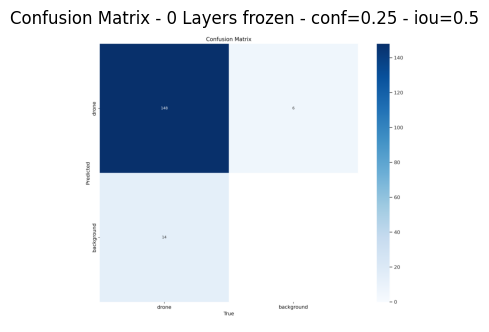

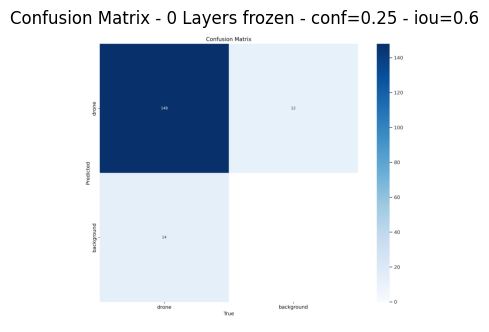

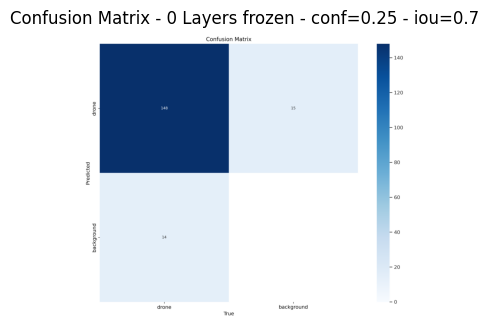

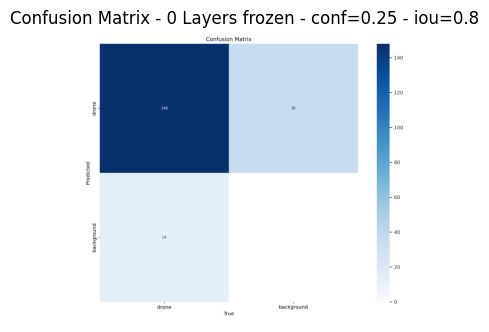

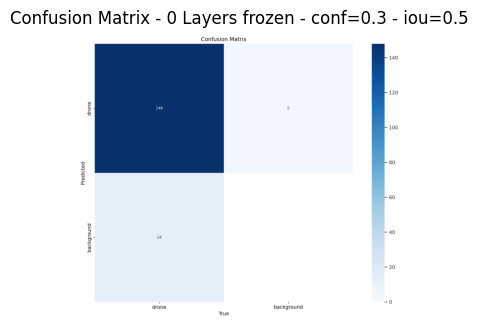

...

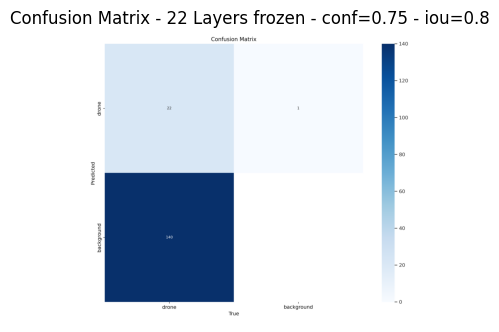

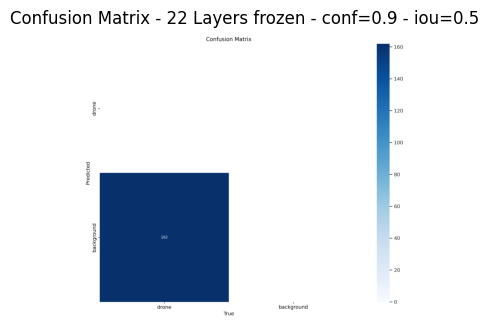

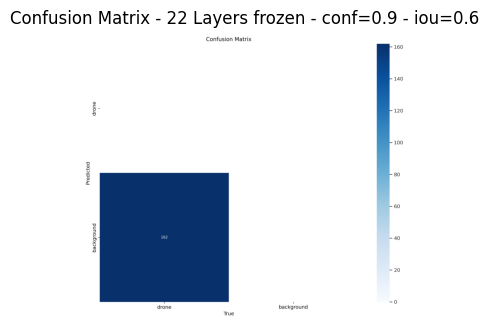

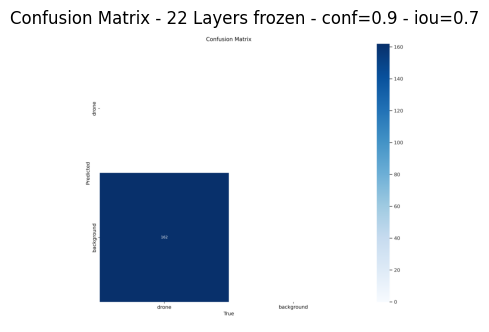

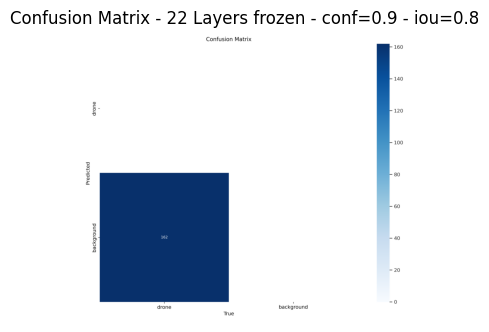

In [20]:
#-- Plot Confusion Matrix for Test Data ---------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS: 
    for conf in CONF_THRESHOLDS:
        for iou in IOU_THRESHOLDS:   
    
            cms_path = output_path + 'model_' + str(n_frozen) + '_frozen/test/test_' + str(conf) + '_' + str(iou) + '/'
            cm_file = cms_path + 'confusion_matrix.png'            
            cm = cv2.cvtColor(cv2.imread(cm_file),cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(5,4))
            plt.title(f'Confusion Matrix - {n_frozen} Layers frozen - conf={conf} - iou={iou}')
            plt.axis('off')
            plt.imshow(cm)   
#------------------------------------------------------------------------------------------------------------

13-1: Plot and Compare mAP on Test Data:

In [21]:
#-- Plot and Compare mAP on Test Data  --------------------------------------------------------------------------------
def plot_mAP_results(number_of_frozen_layers):
    
    #-- load results --
    df_file = 'model_' + str(number_of_frozen_layers) + '_results.csv'
    df = pd.read_csv(output_path + df_file)
    
    #-- list of metrics --
    metrics = ['map_50_95', 'map_50', 'map_75']
    
    #-- create figure --
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f'mAP - {number_of_frozen_layers} frozen Layers\n')
    
    #-- plot bars for all metrics --
    i = 0
    for mtr in metrics:    
        sub_df = df[['conf' , 'iou' , mtr]]   
        sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)        
        
        bars = axes[i].bar(sub_df['x_ticks'], sub_df[mtr], color = 'blue')    
        
        max_index = sub_df[mtr].idxmax()
        max_value = sub_df[mtr].max() 
        
        #-- Set a different color for the bar with the maximum value --
        bars[max_index].set_color('green')
        axes[i].text(max_index, max_value, f'Max: {round(max_value,4)}', ha='center', va='bottom')
        
        axes[i].set_title(mtr)           
        axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90) 
        
        i = i+1

    plt.savefig(plots_dir + 'mAP_'+ str(number_of_frozen_layers) +  '.png', bbox_inches='tight')
    plt.show()    
#------------------------------------------------------------------------------------------------------------   

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

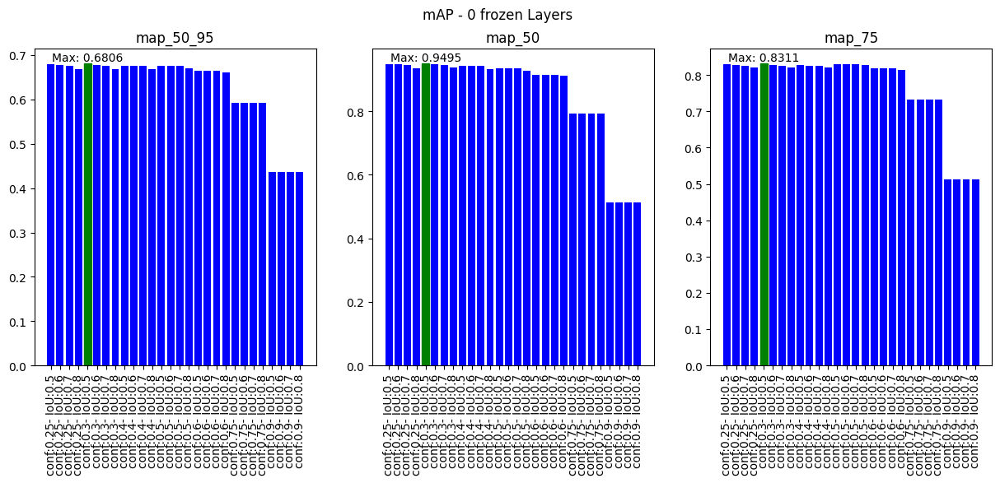

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

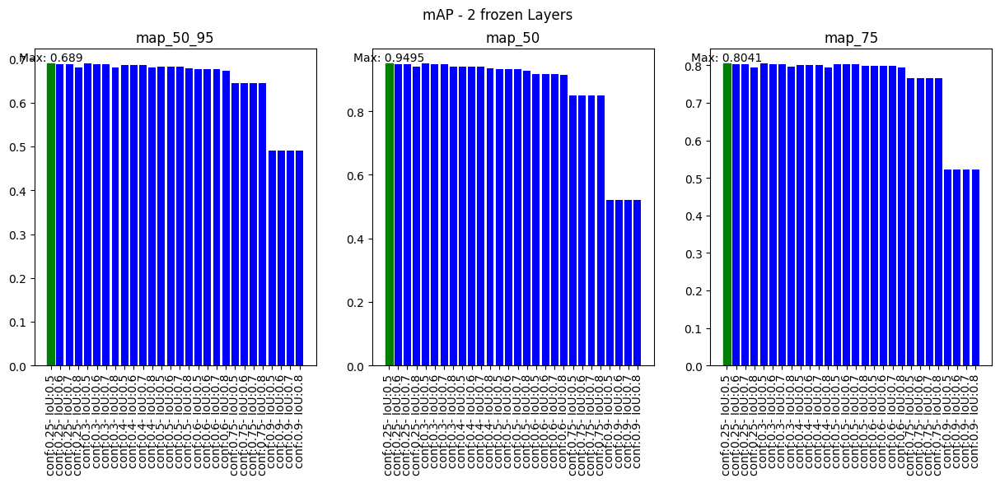

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

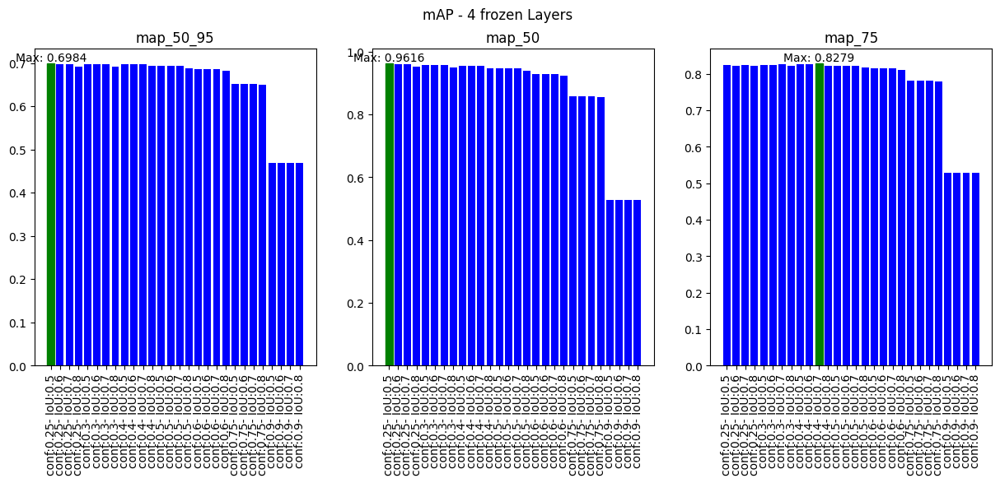

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

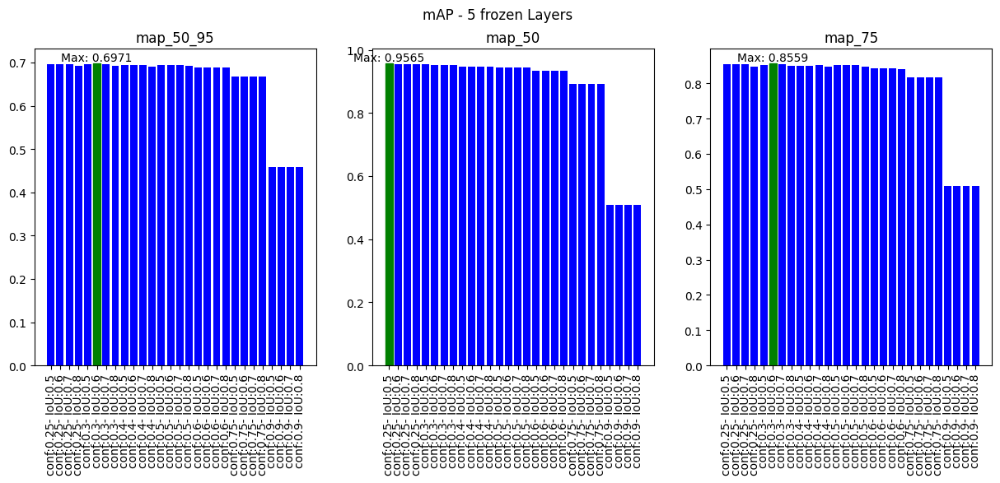

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

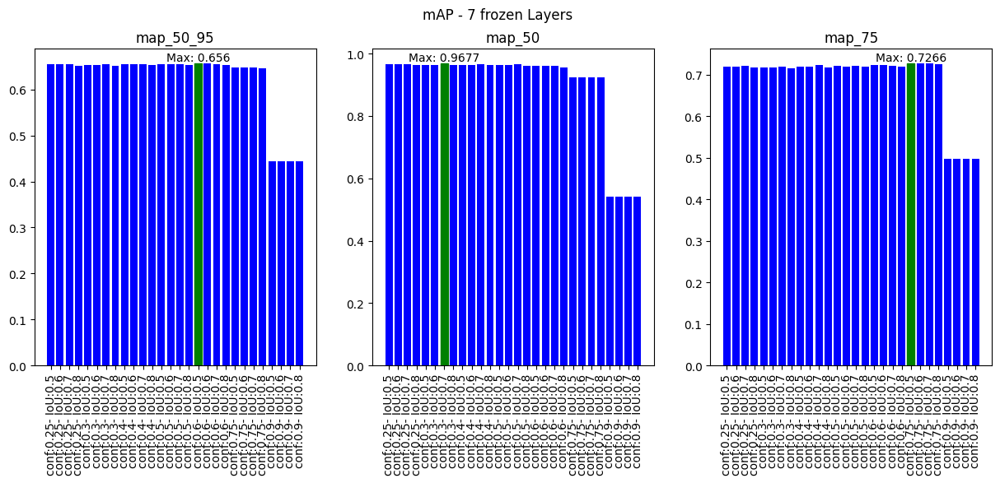

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

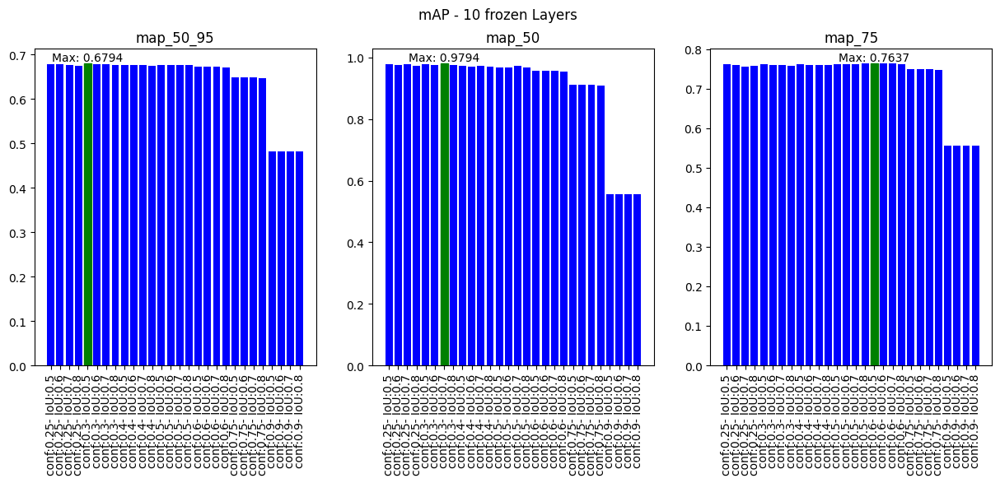

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

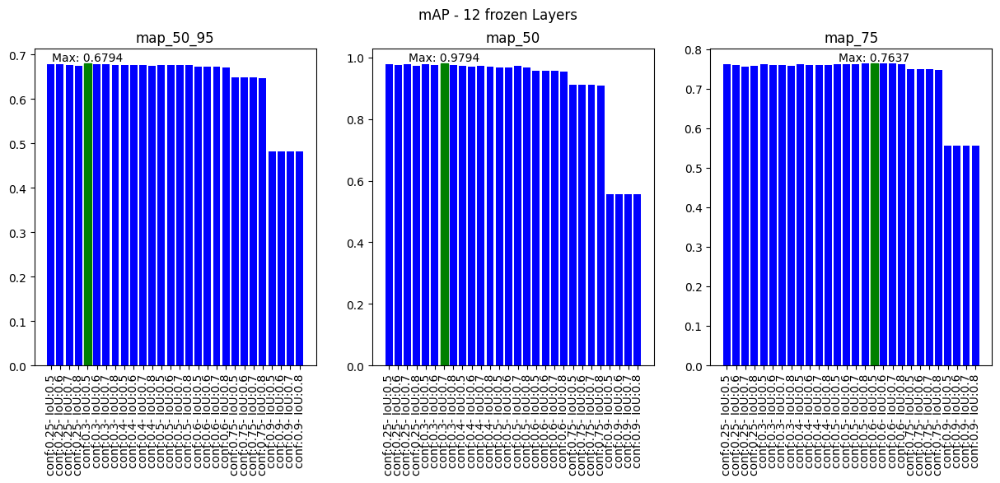

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

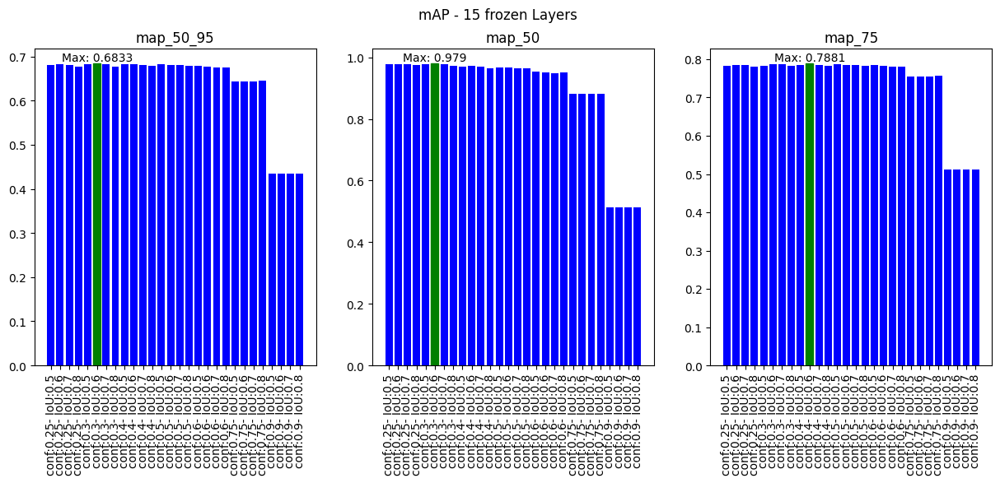

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

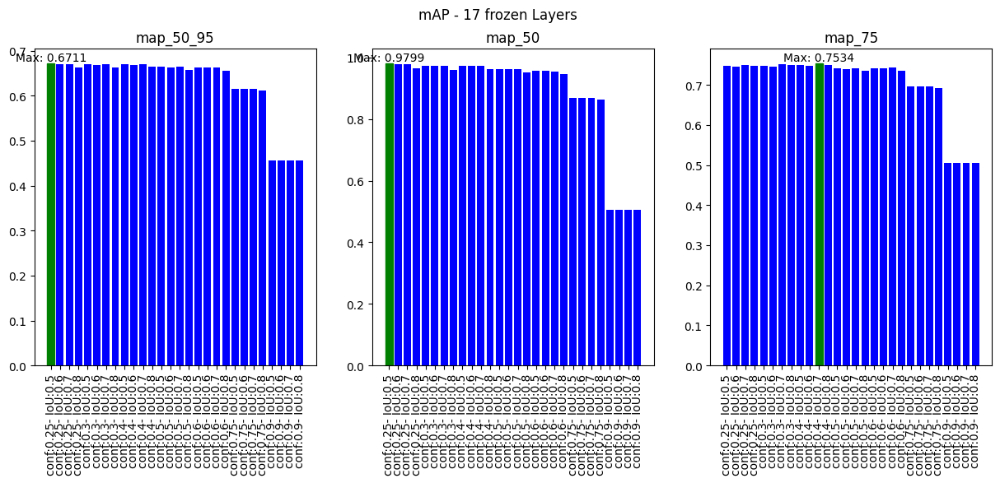

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

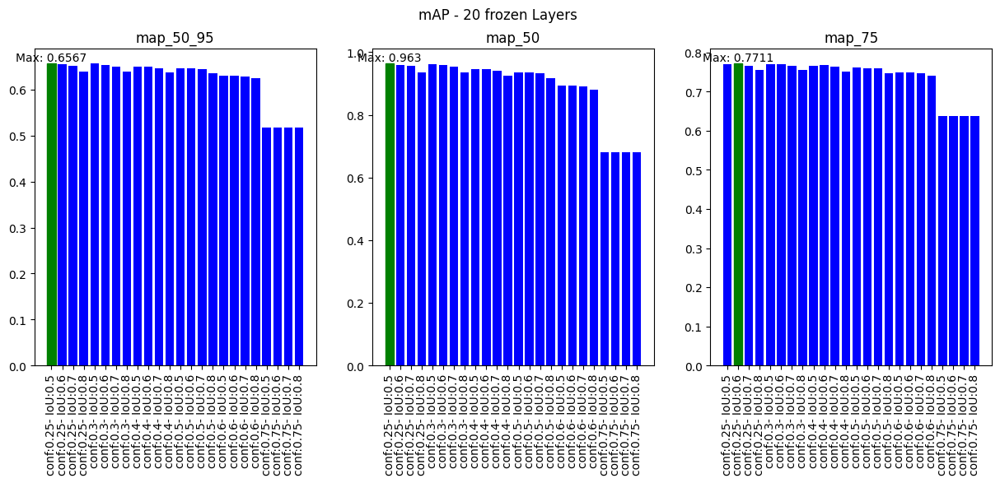

/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  sub_df['iou'].astype(str)
/tmp/ipykernel_26/3316658907.py:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = sub_df['x_ticks'], rotation=90)
/tmp/ipykernel_26/3316658907.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['x_ticks'] = 'conf:' + sub_df['conf'].astype(str) + '- IoU:' +  su

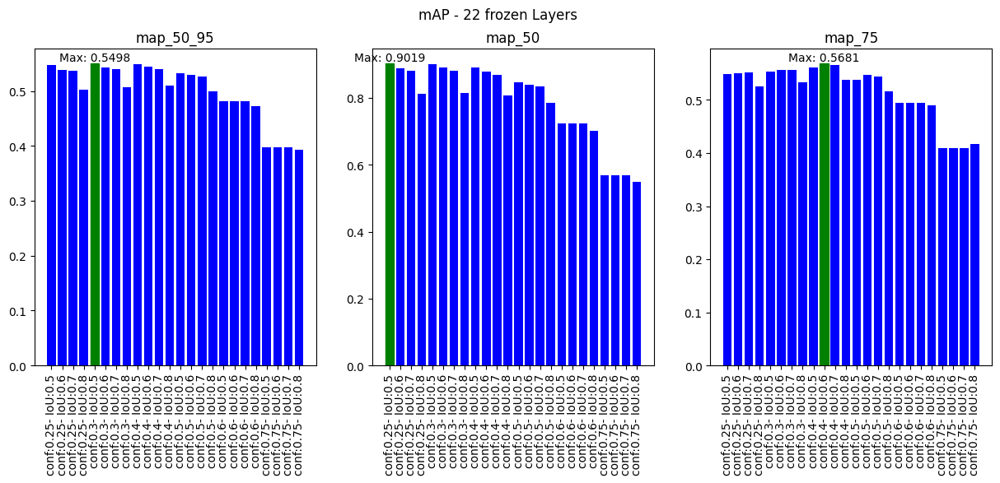

In [22]:
#-- Plot and Compare mAP on Test Data for all Models ------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS: 
    plot_mAP_results(n_frozen)
#----------------------------------------------------------------------------------------------------------------------

13-2: Assess the impact of the number of frozen layers on the model's performance:

In [23]:
#-- Plot and Compare Best Results ------------------------------------------------------------------------------------
def plot_best_mAP_results():
    
    #-- list of metrics --
    metrics = ['map_50', 'map_75', 'map_50_95']
    
    #-- get best results for each model --
    reults = {}
    for m in metrics:
        reults[m] = []
        for n in NUMBER_OF_FROZEN_LAYERS:
            
            df_file = 'model_' + str(n) + '_results.csv'
            df = pd.read_csv(df_file)           

            max_index = df[m].idxmax()
            max_value = df[m].max()  
            reults[m].append(max_value)            

    #-- create figure --
    fig, axes = plt.subplots(3, 1, figsize=(8, 15))
    fig.suptitle('Comparing the effects of the number of frozen layers')
    
    #-- plot bars --
    i = 0
    for metric , values in reults.items():
        y = values
        x = [str(l) for l in NUMBER_OF_FROZEN_LAYERS]         
        
        bars = axes[i].bar(x, y)
        
        max_value = max(y)
        max_index = y.index(max_value) 
        bars[max_index].set_color('green')
        
        axes[i].text(max_index, max_value, f'Max: {round(max_value,4)}', ha='center', va='bottom')
        
        axes[i].set_title(metric)           
        axes[i].set_xticklabels(labels = x) 
        
        i += 1

    plt.savefig(plots_dir + 'compare_best_mAP_values.png', bbox_inches='tight')
    plt.show()   
#----------------------------------------------------------------------------------------------------------------------

/tmp/ipykernel_26/553628623.py:39: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(labels = x)


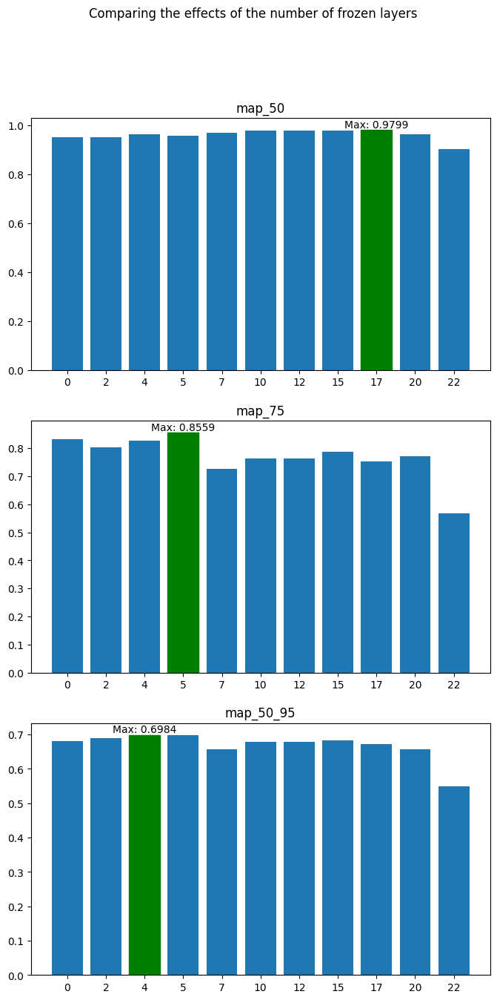

In [24]:
#-- Plot and Compare Best Results for Models with different frozen Layers ------------------------------------------------
plot_best_mAP_results()
#----------------------------------------------------------------------------------------------------------------------

14- Make predictions in test images.:

In [25]:
#-- Get best conf and iou values for map_50 for each model ----------------------------------------------------------------
metric = 'map_50'

#-- create dict: key = NUMBER_OF_FROZEN_LAYERS , value = (conf , iou) for best map_50 --
best_results = {}

for n_frozen in NUMBER_OF_FROZEN_LAYERS:
    
    df_file = 'model_' + str(n_frozen) + '_results.csv'
    df = pd.read_csv(df_file) 
    
    sub_df = df[['conf' , 'iou' , metric]]        
    max_index = sub_df[metric].idxmax()    
    max_conf = sub_df.loc[max_index, 'conf']
    max_iou = sub_df.loc[max_index, 'iou'] 
    
    best_results[n_frozen] = (max_conf,max_iou)
#----------------------------------------------------------------------------------------------------------------------

In [26]:
#-- Predict Drone Objects on Test Images ----------------------------------------------------------------------------------
for n_frozen in NUMBER_OF_FROZEN_LAYERS:   
    
    #-- load best model --
    best_model_file = output_path + 'model_' + str(n_frozen) + '_frozen' + '/train/weights/best.pt'
    best_model = YOLO(best_model_file)       
    
    #-- get conf and iou for best map_50 --
    max_conf = best_results[n_frozen][0]
    max_iou = best_results[n_frozen][1]
    
    #-- set project and name for creating result dir --
    project_value = 'model_' + str(n_frozen) + '_frozen/predictions'   
    name_value = 'predictions_' + str(max_conf) + '_' + str(max_iou)      
      
    best_model.predict(source = test_img_dir,
                       conf = max_conf,
                       iou = max_iou,
                       show = False,
                       save= True,
                       project= project_value,
                       name=name_value) 
display.clear_output()
print('Finished Predicting :)')
#---------------------------------------------------------------------------------------------------------------

Finished Predicting :)


15- Visualize five images with ground truth labels alongside predicted objects using various trained models.

In [27]:
#-- Plot a Ground Truth Image next to All Predicted Images ------------------------------------------------------
def plot_images(images, file_name):
    
    #-- create figure --
    fig, axes = plt.subplots(6, 2, figsize=(12, 20))

    #-- Flatten the 6x4 array of axes into a 1D array --
    axes = axes.flatten()
    
    for i, (img, ax) in enumerate(zip(images, axes)):
        ax.imshow(img)         #ax.imshow(img, cmap='gray')  # Assuming grayscale images        
        ax.set_xticks([])
        ax.set_yticks([])
        
        title = ''
        if i==0:
            title = 'Ground Truth'
        else:
            title = f'Predicted - {NUMBER_OF_FROZEN_LAYERS[i-1]} frozen layers'

        ax.set_title(title)

    
    plt.tight_layout()
    
    plt.savefig(file_name, bbox_inches='tight')
    plt.show()
#---------------------------------------------------------------------------------------------------------------

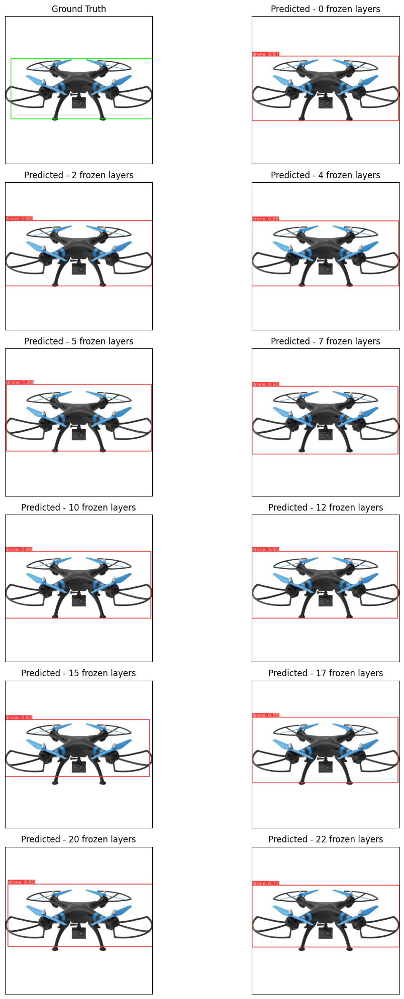

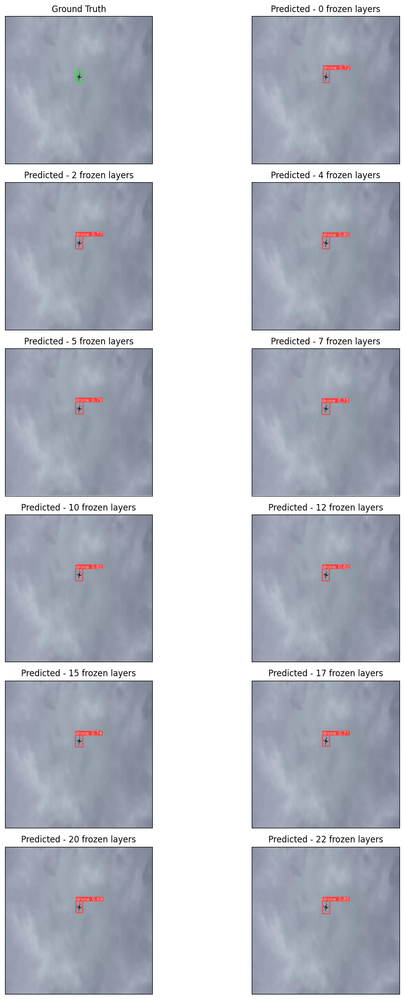

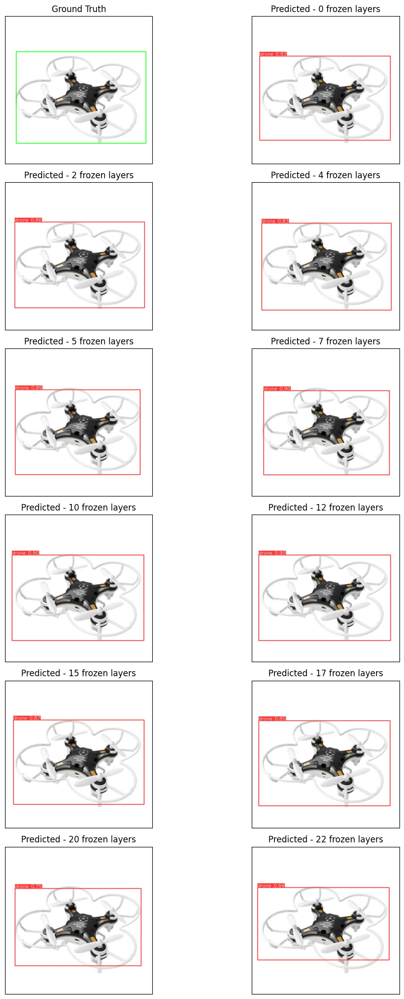

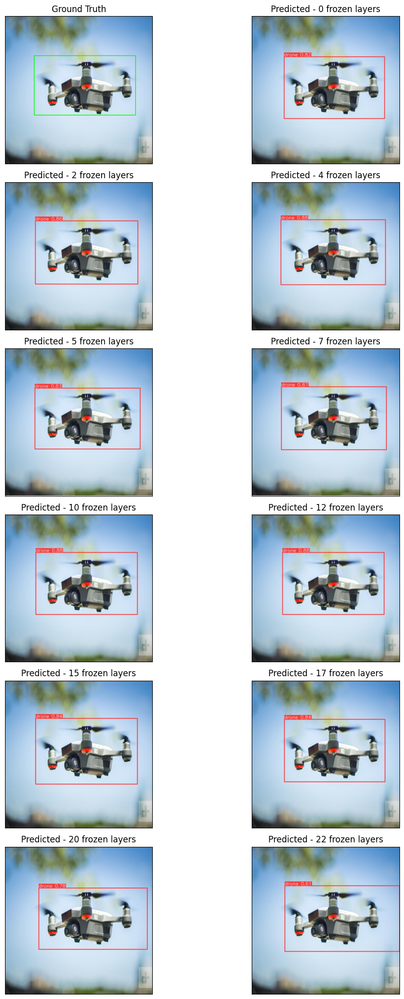

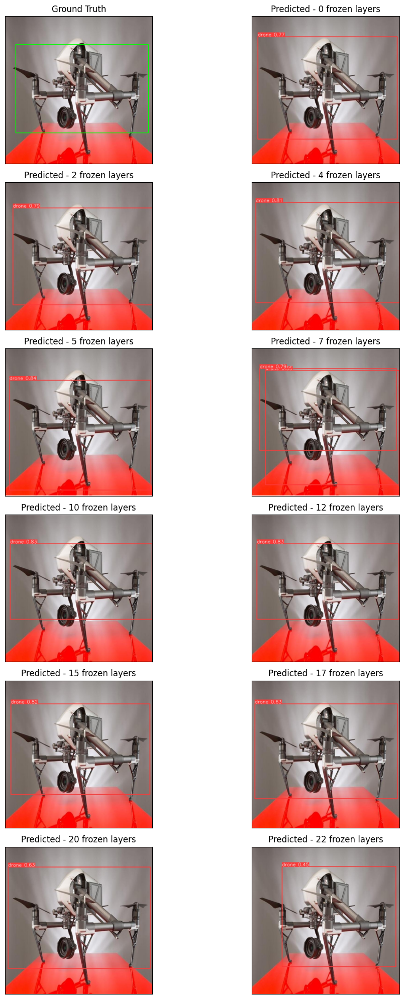

In [28]:
#-- Plot Ground Truth and Predictions for 5 random Images from Test Data ---------------------------------------
#-- Get a list of image file names in Test Dir --
image_files = [f for f in os.listdir(test_img_dir) if f.endswith('.jpg')]
random.shuffle(image_files)

#-- Select 5 random images --
selected_images = image_files[:5]

for img_file in selected_images:
    
    #-- set path --
    img_path = os.path.join(test_img_dir, img_file)
    gt_bbox_path = os.path.join(test_lbl_dir, os.path.splitext(img_file)[0] + '.txt')
    
    #-- load image --
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_shape = img.shape

    #-- Read and draw bounding boxes --
    gt_bboxes = read_bboxes(gt_bbox_path, img_shape)
    gt_image_with_bboxes = draw_bboxes(img.copy(), gt_bboxes)

    #-- create list of ground truth image and all predictions --
    images = []
    images.append(gt_image_with_bboxes)

    for n_frozen in NUMBER_OF_FROZEN_LAYERS:    

        #-- get conf and iou for best map_50 --
        max_conf = best_results[n_frozen][0]
        max_iou = best_results[n_frozen][1]

        #-- set path --
        project_value = 'model_' + str(n_frozen) + '_frozen/predictions/'   
        name_value = 'predictions_' + str(max_conf) + '_' + str(max_iou) 
        pred_img_path = project_value + name_value + '/'
        pred_img_file = os.path.join(pred_img_path, img_file)

        #-- load predicted images --
        pred_img = cv2.imread(pred_img_file)
        pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB) 

        images.append(pred_img)  
    
    file_name = plots_dir + 'predictions_' + str(img_file) + '.png'
    plot_images(images, file_name)
#---------------------------------------------------------------------------------------------------------------